<div style='background-color: orange'>
<a id='TableOfContents'></a>
    <b><u><i><h1 style='text-align: center'>
        Table of Contents
    </h1></i></u></b>
<li><a href='#imports'>Imports</a></li>
<li><a href='#part1'>Graphs and Stats</a></li>
<li><a href='#clusters'>Clustering</a></li>
<li><a href='#model'>Modeling</a></li>
<li><a href='#misc'>Miscellaneous</a></li>

<div style='background-color: orange'>
<a id='imports'></a>
    <b><u><i><h1 style='text-align: center'>
        Imports
    </h1></i></u></b>
    <li><a href='#TableOfContents'>Table of Contents</a></li>

In [1]:
# Vectorization & Dataframe
import numpy as np
import pandas as pd

# Visualizations
import matplotlib.pyplot as plt
import seaborn as sns

# stats
from scipy import stats

# Glorious itertools
import itertools

# randomforest modeling
from sklearn.ensemble import RandomForestClassifier as RFC
from sklearn.metrics import accuracy_score

# Scaling (sklearn)
from sklearn.preprocessing import MinMaxScaler

# Clustering (sklearn)
from sklearn.cluster import KMeans

# .py files
import wrangle_j as w

<div style='background-color: orange'>
<a id='part1'></a>
    <b><u><i><h1 style='text-align: center'>
        Graphs and stats
    </h1></i></u></b>
    <li><a href='#TableOfContents'>Table of Contents</a></li>

In [2]:
train, validate, test = w.wrangle_wines_mvp()
train.sample()

train.shape:(3637, 13)
validate.shape:(1560, 13)
test.shape:(1300, 13)


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_color
2479,6.6,0.24,0.3,13.0,0.052,18.0,143.0,0.99825,3.37,0.49,9.4,6,white


In [3]:
wines = pd.read_csv('wines.csv', index_col=0)

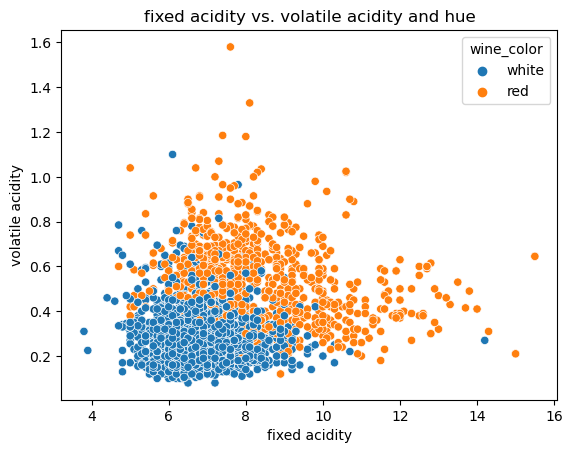

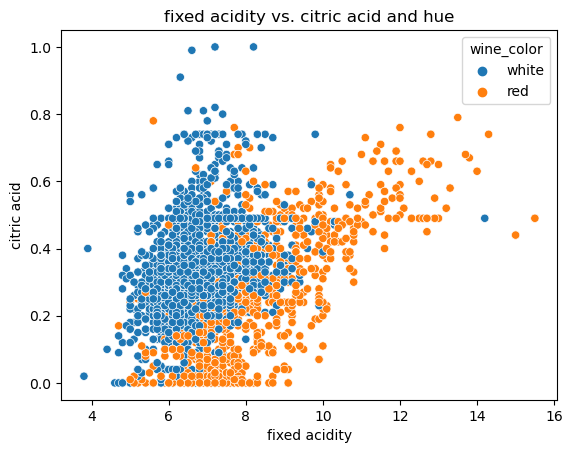

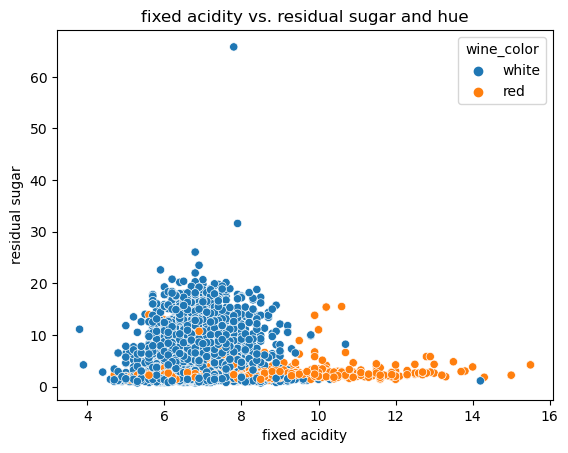

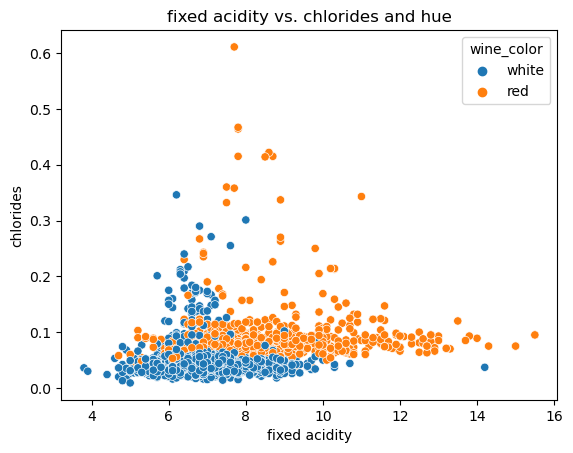

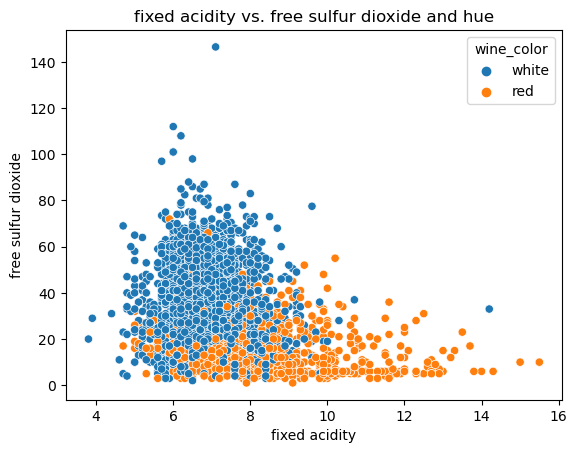

...

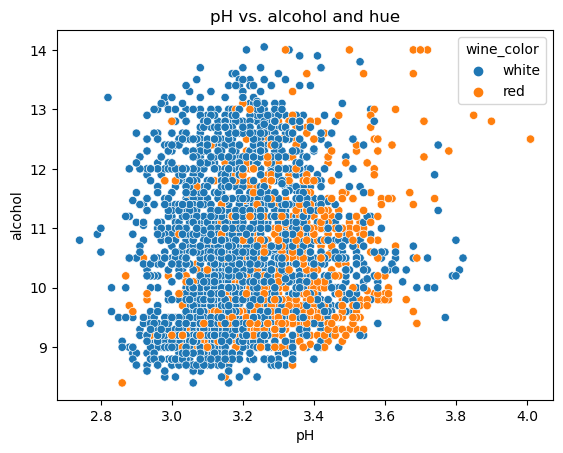

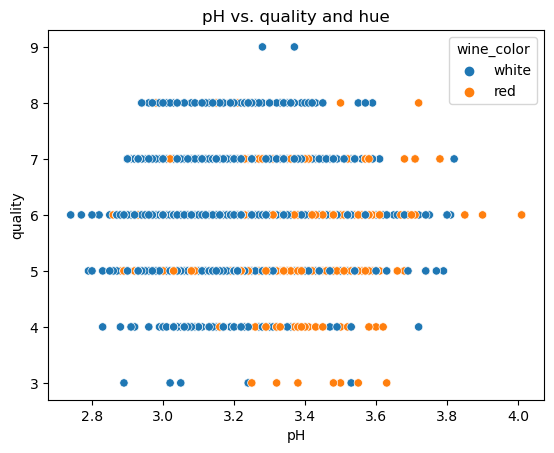

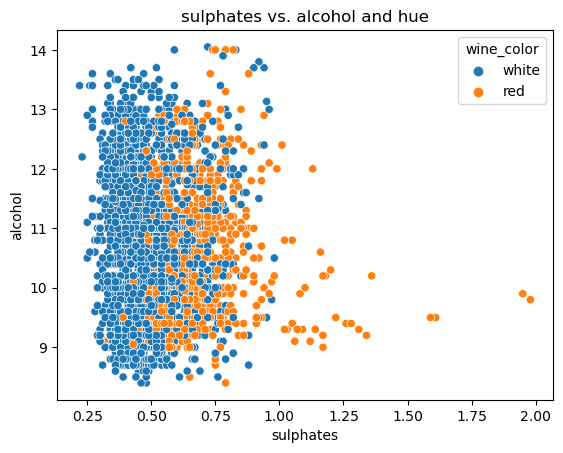

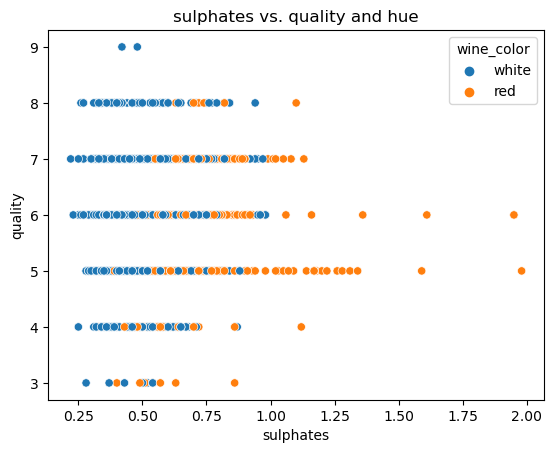

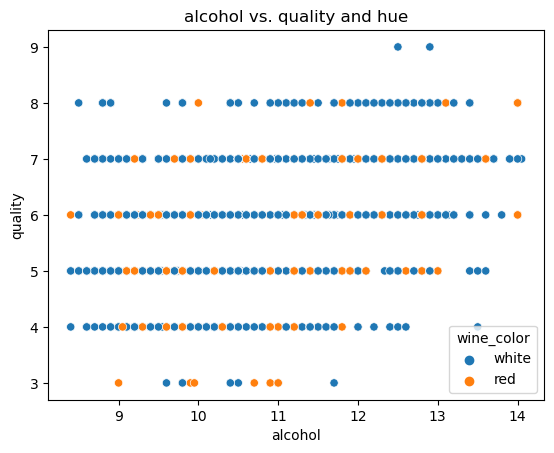

In [4]:
# Identify cols for scatterplots
colforexp = train.drop(columns='wine_color').columns.to_list()
combos = list(itertools.combinations(colforexp, 2))
for combo in combos:
    sns.scatterplot(data=train, x=combo[0], y=combo[1], hue='wine_color')
    plt.title(f'{combo[0]} vs. {combo[1]} and hue')
    plt.show()

In [5]:
# Create cols and combination of cols
fuckit_cols = train.drop(columns='wine_color').columns.to_list()
combos = list(itertools.combinations(fuckit_cols, 2))

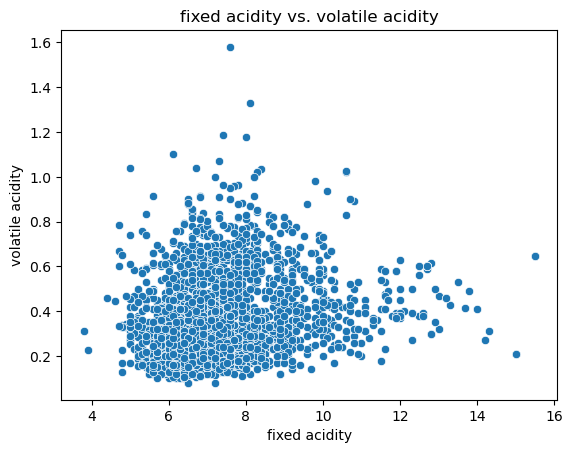

REJECT NULL HYPOTHESIS!
Feature: fixed acidity and volatile acidity
Correlation: 0.2145
P-Value: 0.0000


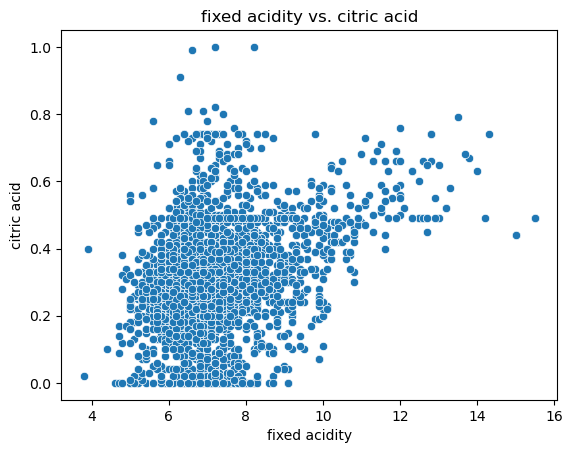

REJECT NULL HYPOTHESIS!
Feature: fixed acidity and citric acid
Correlation: 0.2599
P-Value: 0.0000


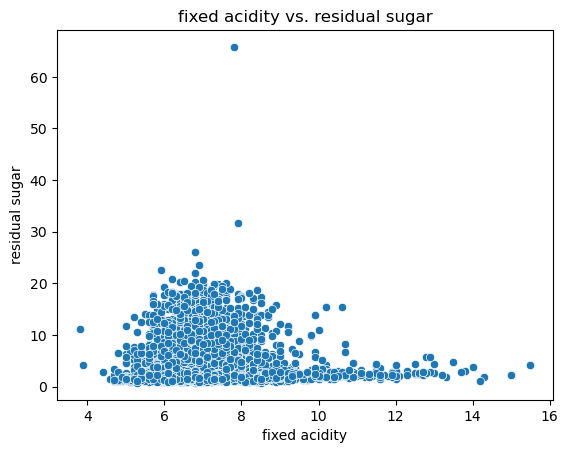

ACCEPT NULL HYPOTHESIS!
Feature: fixed acidity and residual sugar
Correlation: -0.0284
P-Value: 0.0867


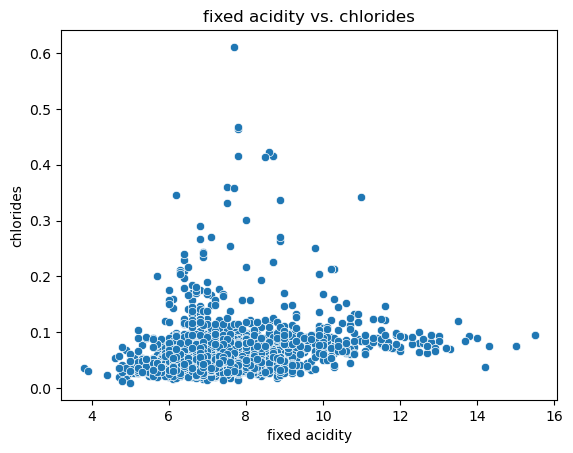

REJECT NULL HYPOTHESIS!
Feature: fixed acidity and chlorides
Correlation: 0.3513
P-Value: 0.0000


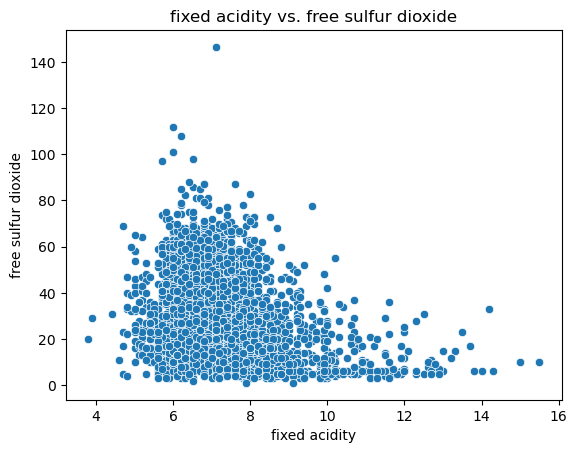

REJECT NULL HYPOTHESIS!
Feature: fixed acidity and free sulfur dioxide
Correlation: -0.2609
P-Value: 0.0000


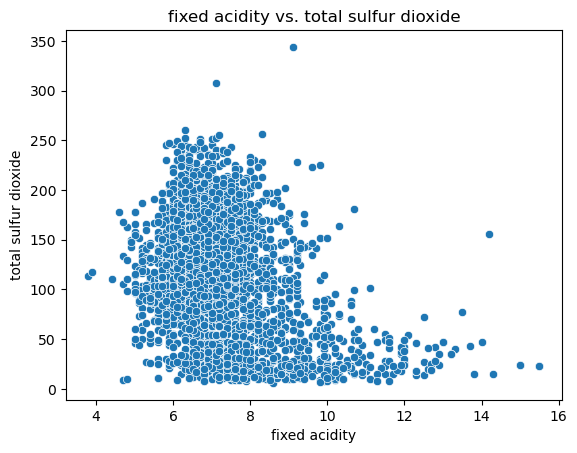

REJECT NULL HYPOTHESIS!
Feature: fixed acidity and total sulfur dioxide
Correlation: -0.2438
P-Value: 0.0000


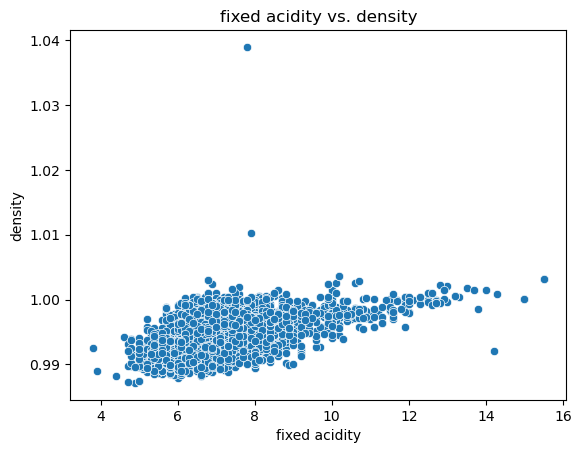

REJECT NULL HYPOTHESIS!
Feature: fixed acidity and density
Correlation: 0.4363
P-Value: 0.0000


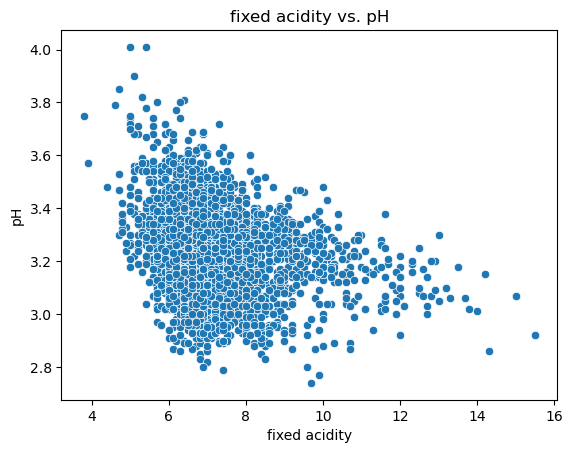

REJECT NULL HYPOTHESIS!
Feature: fixed acidity and pH
Correlation: -0.2172
P-Value: 0.0000


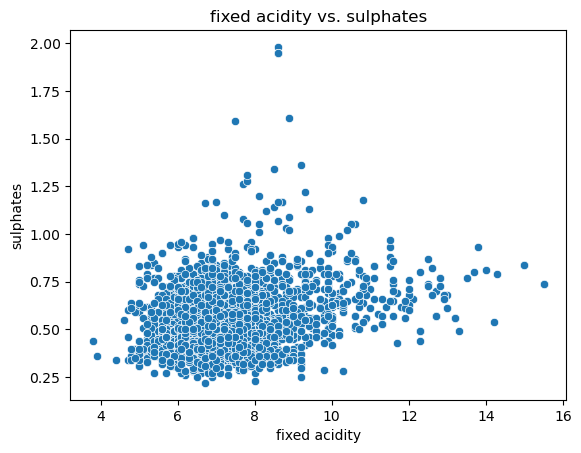

REJECT NULL HYPOTHESIS!
Feature: fixed acidity and sulphates
Correlation: 0.2233
P-Value: 0.0000


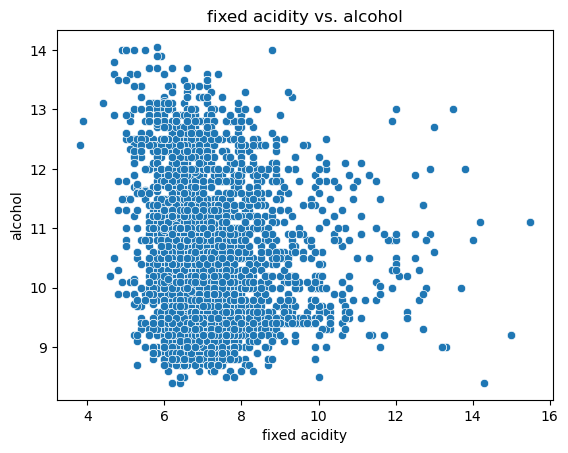

REJECT NULL HYPOTHESIS!
Feature: fixed acidity and alcohol
Correlation: -0.1106
P-Value: 0.0000


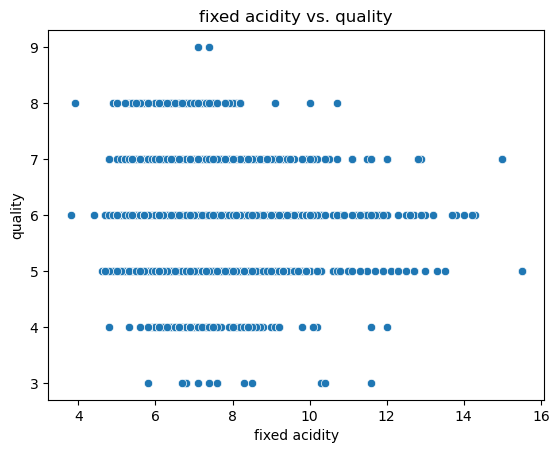

REJECT NULL HYPOTHESIS!
Feature: fixed acidity and quality
Correlation: -0.0970
P-Value: 0.0000


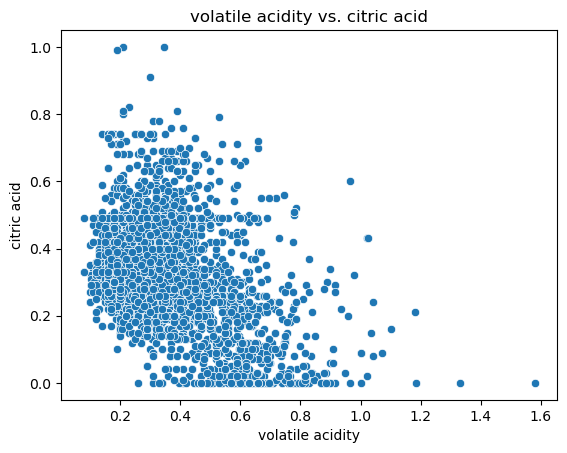

REJECT NULL HYPOTHESIS!
Feature: volatile acidity and citric acid
Correlation: -0.3170
P-Value: 0.0000


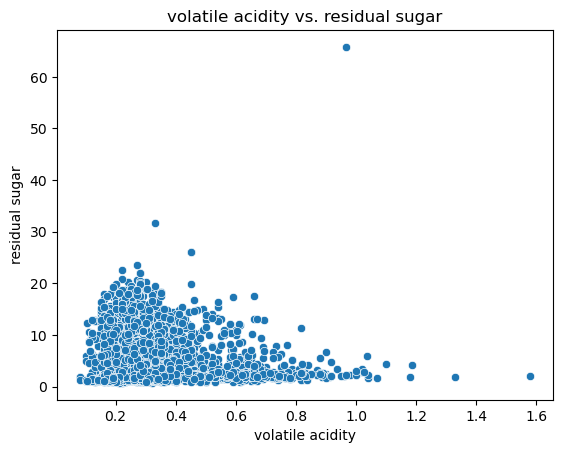

REJECT NULL HYPOTHESIS!
Feature: volatile acidity and residual sugar
Correlation: -0.0714
P-Value: 0.0000


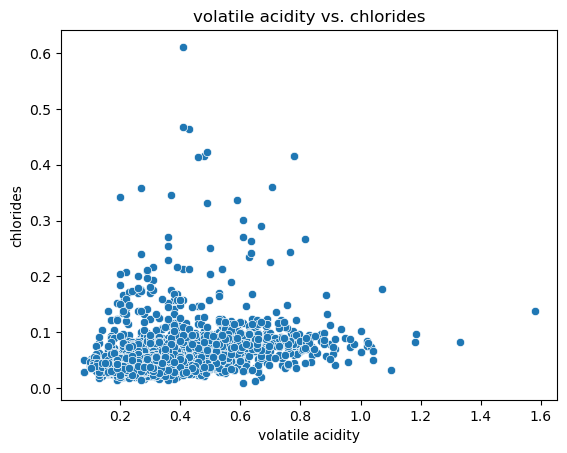

REJECT NULL HYPOTHESIS!
Feature: volatile acidity and chlorides
Correlation: 0.4117
P-Value: 0.0000


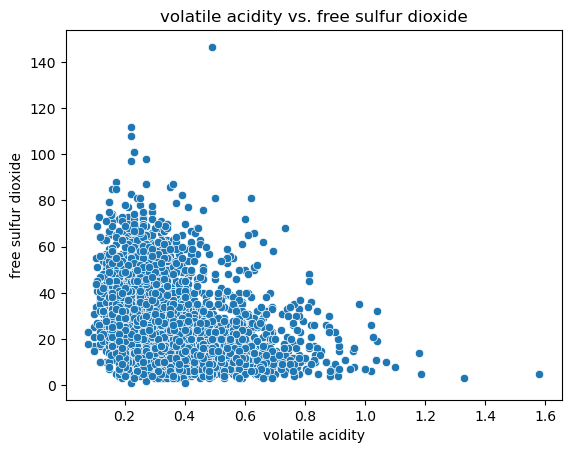

REJECT NULL HYPOTHESIS!
Feature: volatile acidity and free sulfur dioxide
Correlation: -0.3723
P-Value: 0.0000


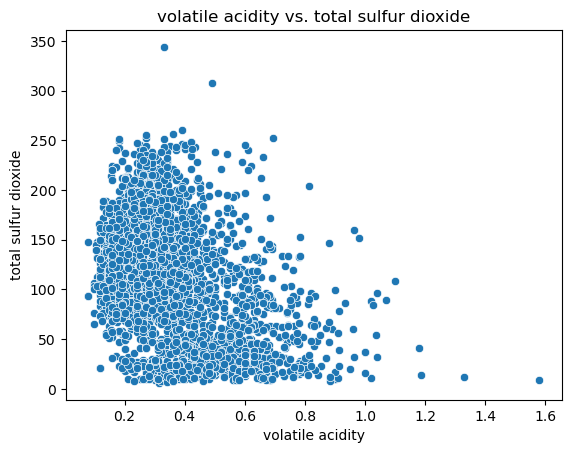

REJECT NULL HYPOTHESIS!
Feature: volatile acidity and total sulfur dioxide
Correlation: -0.3550
P-Value: 0.0000


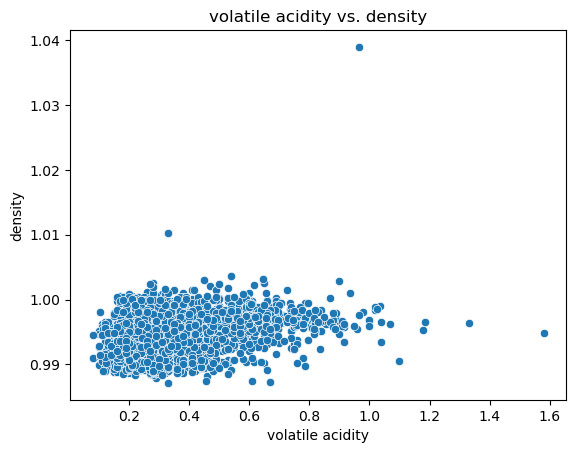

REJECT NULL HYPOTHESIS!
Feature: volatile acidity and density
Correlation: 0.2639
P-Value: 0.0000


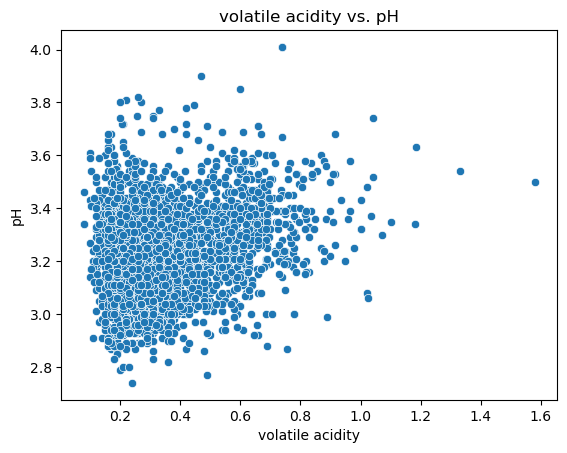

REJECT NULL HYPOTHESIS!
Feature: volatile acidity and pH
Correlation: 0.2048
P-Value: 0.0000


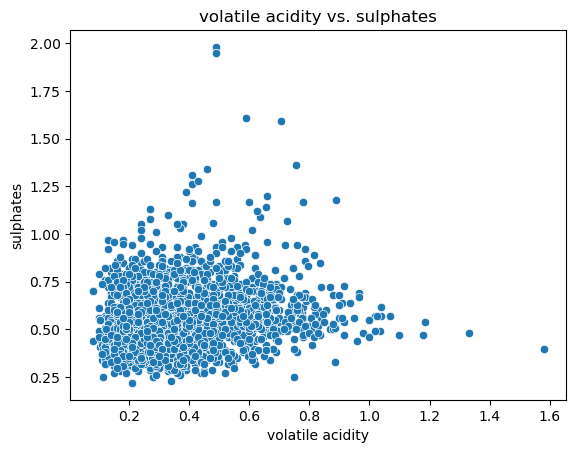

REJECT NULL HYPOTHESIS!
Feature: volatile acidity and sulphates
Correlation: 0.2582
P-Value: 0.0000


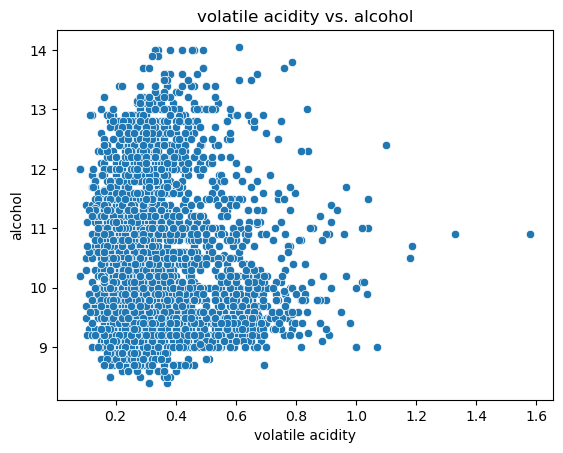

ACCEPT NULL HYPOTHESIS!
Feature: volatile acidity and alcohol
Correlation: -0.0288
P-Value: 0.0826


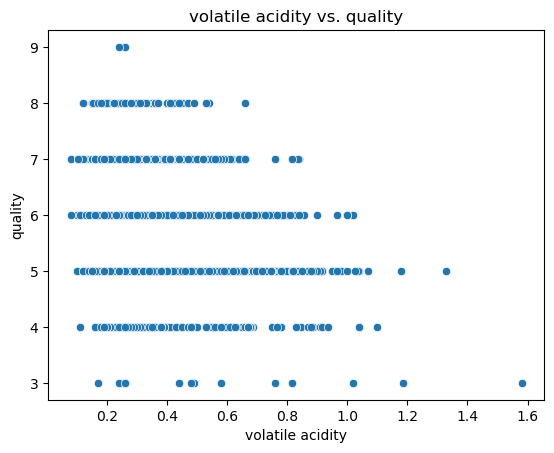

REJECT NULL HYPOTHESIS!
Feature: volatile acidity and quality
Correlation: -0.2490
P-Value: 0.0000


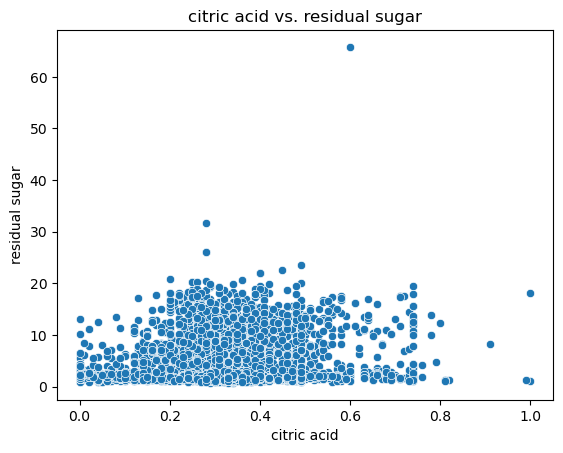

REJECT NULL HYPOTHESIS!
Feature: citric acid and residual sugar
Correlation: 0.0714
P-Value: 0.0000


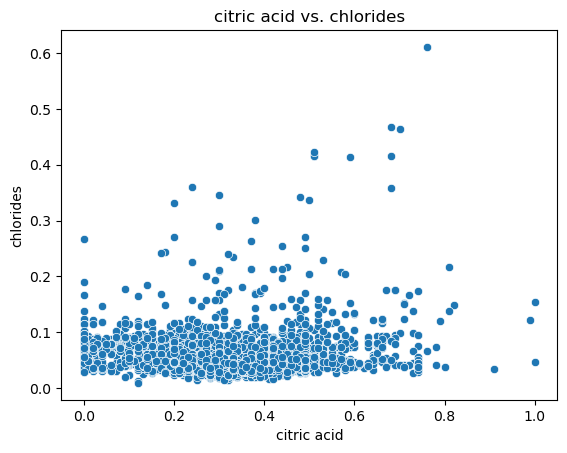

REJECT NULL HYPOTHESIS!
Feature: citric acid and chlorides
Correlation: -0.0706
P-Value: 0.0000


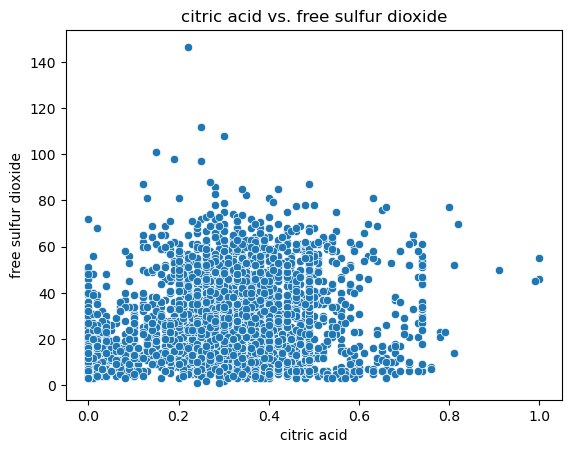

REJECT NULL HYPOTHESIS!
Feature: citric acid and free sulfur dioxide
Correlation: 0.1284
P-Value: 0.0000


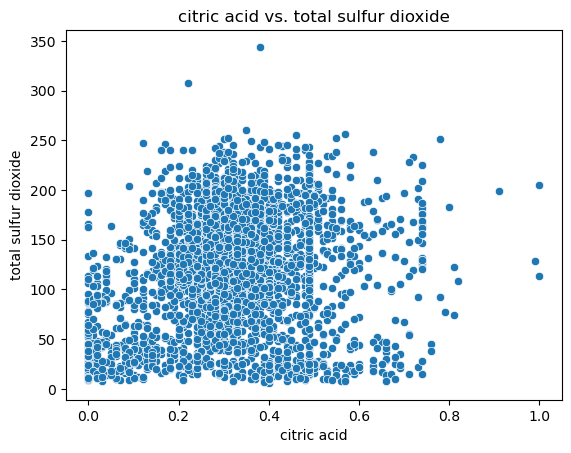

REJECT NULL HYPOTHESIS!
Feature: citric acid and total sulfur dioxide
Correlation: 0.1667
P-Value: 0.0000


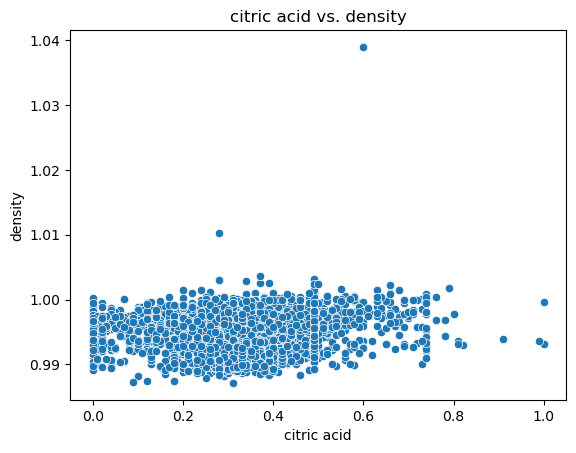

REJECT NULL HYPOTHESIS!
Feature: citric acid and density
Correlation: 0.0558
P-Value: 0.0008


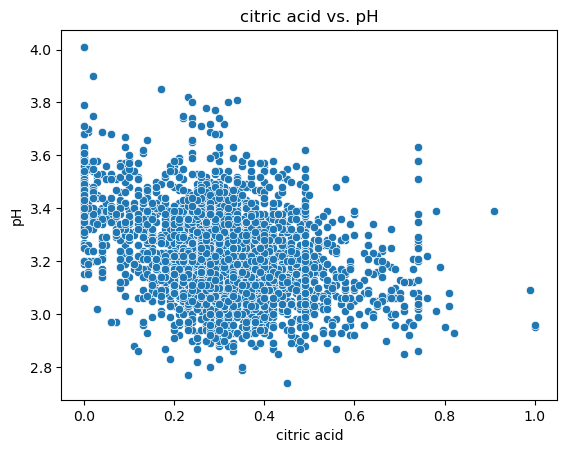

REJECT NULL HYPOTHESIS!
Feature: citric acid and pH
Correlation: -0.2874
P-Value: 0.0000


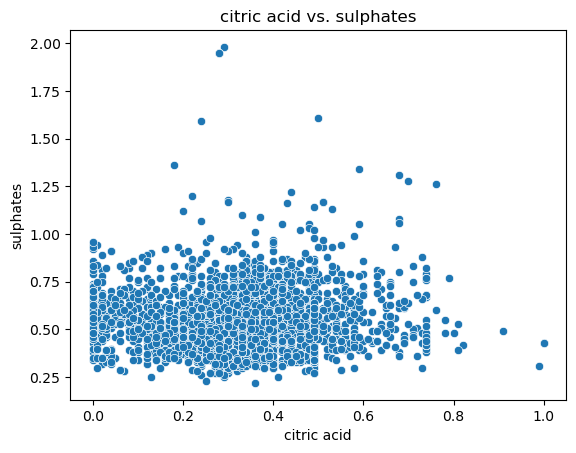

ACCEPT NULL HYPOTHESIS!
Feature: citric acid and sulphates
Correlation: 0.0208
P-Value: 0.2107


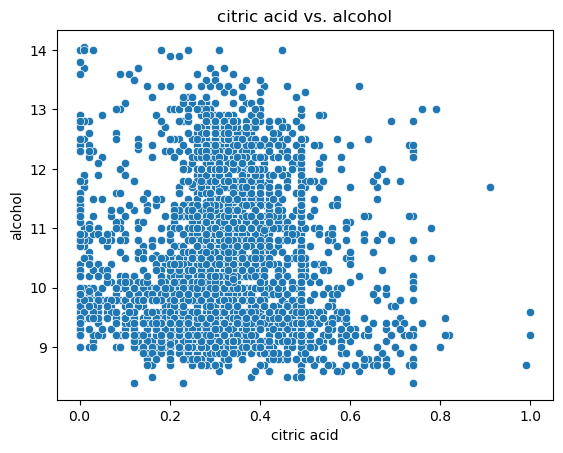

ACCEPT NULL HYPOTHESIS!
Feature: citric acid and alcohol
Correlation: 0.0151
P-Value: 0.3629


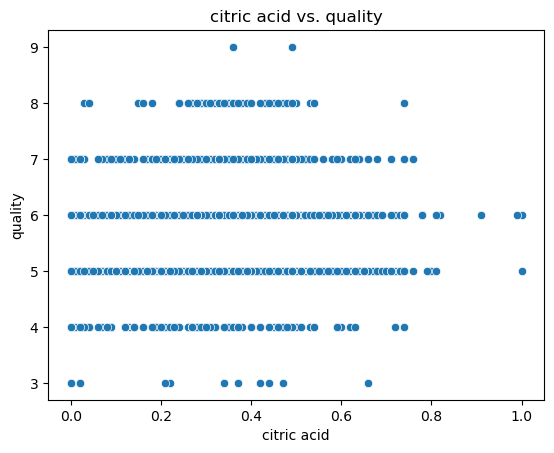

REJECT NULL HYPOTHESIS!
Feature: citric acid and quality
Correlation: 0.0927
P-Value: 0.0000


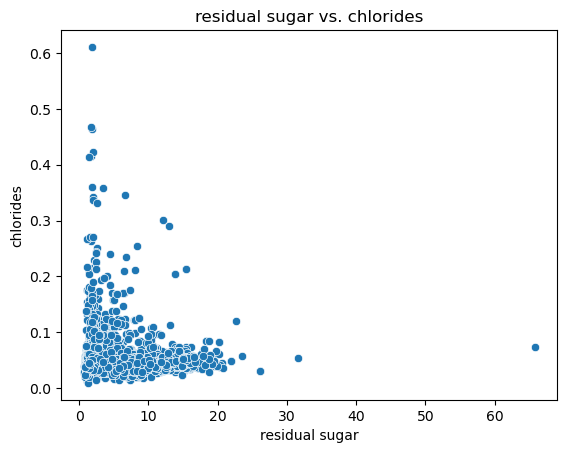

REJECT NULL HYPOTHESIS!
Feature: residual sugar and chlorides
Correlation: -0.0382
P-Value: 0.0214


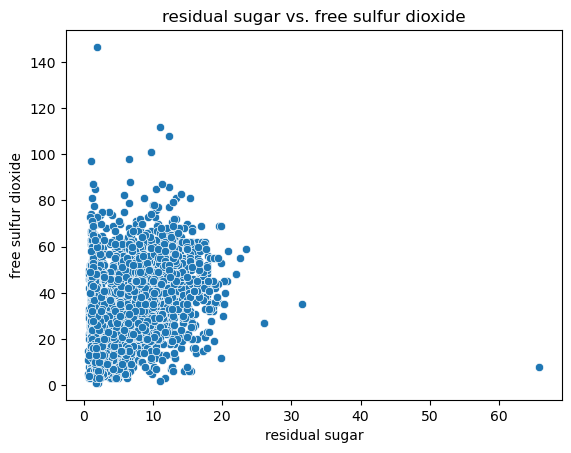

REJECT NULL HYPOTHESIS!
Feature: residual sugar and free sulfur dioxide
Correlation: 0.3805
P-Value: 0.0000


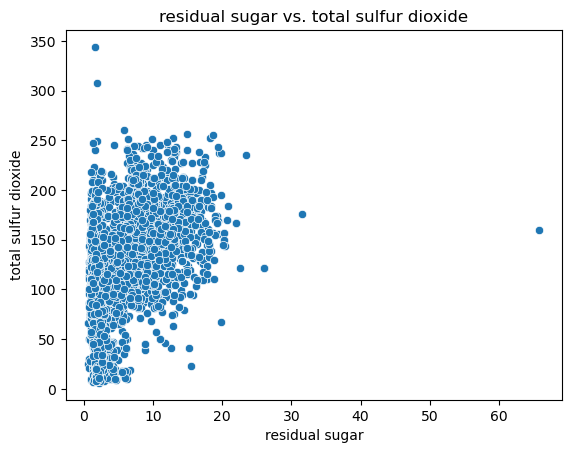

REJECT NULL HYPOTHESIS!
Feature: residual sugar and total sulfur dioxide
Correlation: 0.4505
P-Value: 0.0000


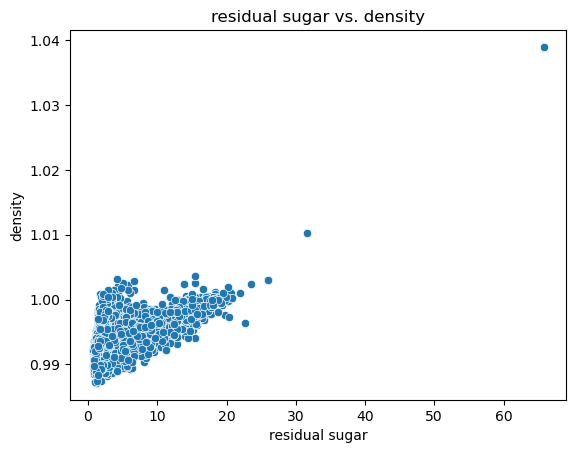

REJECT NULL HYPOTHESIS!
Feature: residual sugar and density
Correlation: 0.5268
P-Value: 0.0000


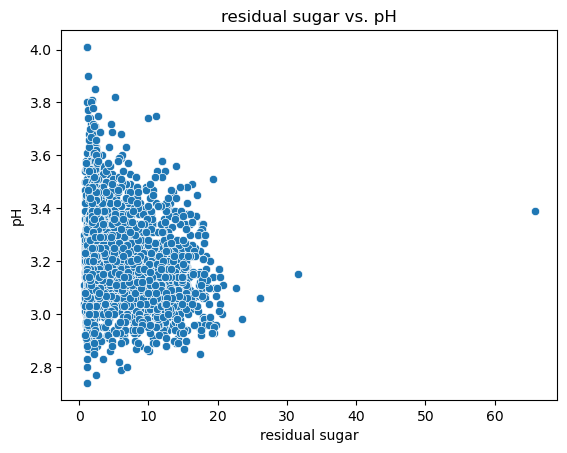

REJECT NULL HYPOTHESIS!
Feature: residual sugar and pH
Correlation: -0.2242
P-Value: 0.0000


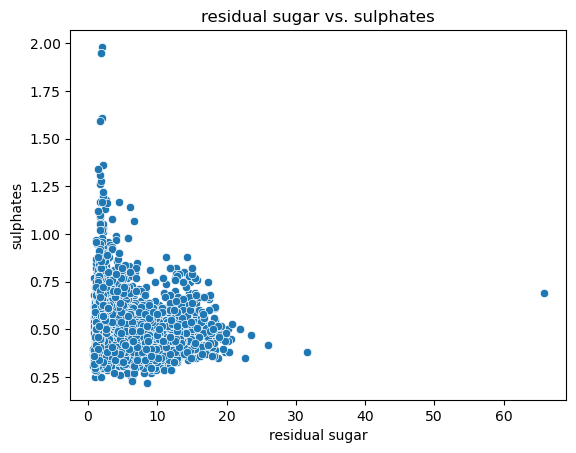

REJECT NULL HYPOTHESIS!
Feature: residual sugar and sulphates
Correlation: -0.1529
P-Value: 0.0000


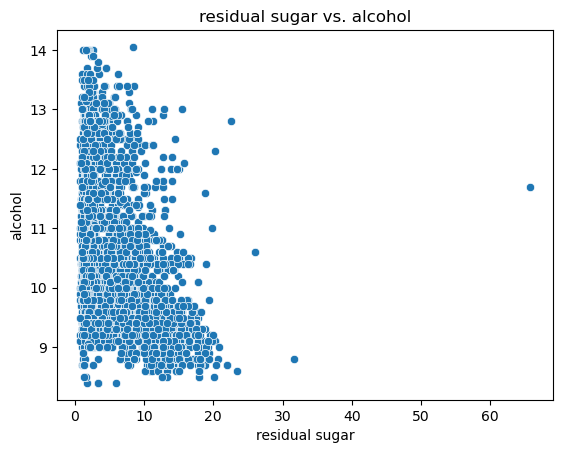

REJECT NULL HYPOTHESIS!
Feature: residual sugar and alcohol
Correlation: -0.3274
P-Value: 0.0000


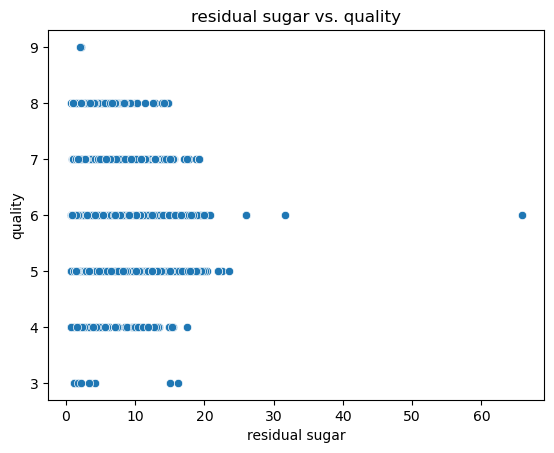

ACCEPT NULL HYPOTHESIS!
Feature: residual sugar and quality
Correlation: -0.0278
P-Value: 0.0933


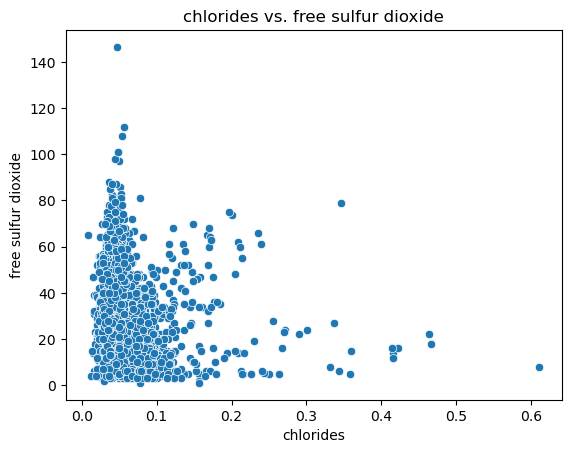

REJECT NULL HYPOTHESIS!
Feature: chlorides and free sulfur dioxide
Correlation: -0.2620
P-Value: 0.0000


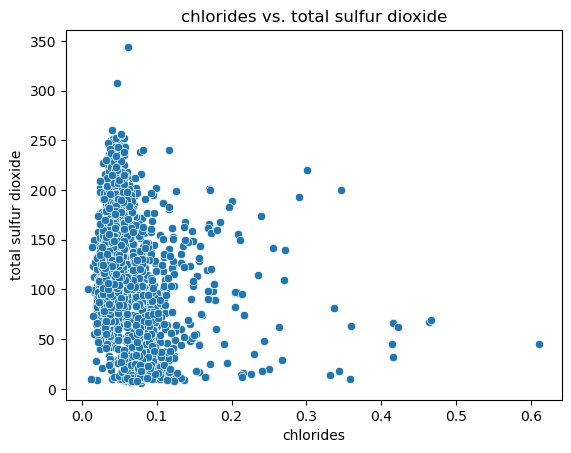

REJECT NULL HYPOTHESIS!
Feature: chlorides and total sulfur dioxide
Correlation: -0.2825
P-Value: 0.0000


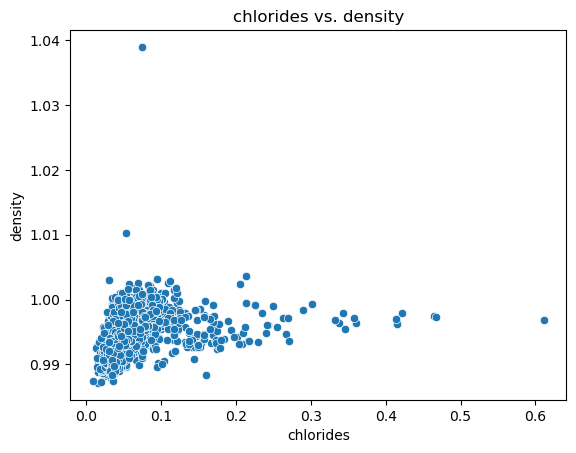

REJECT NULL HYPOTHESIS!
Feature: chlorides and density
Correlation: 0.5879
P-Value: 0.0000


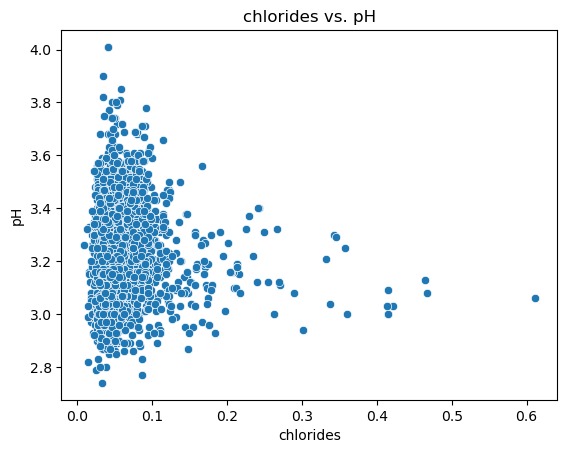

REJECT NULL HYPOTHESIS!
Feature: chlorides and pH
Correlation: 0.1905
P-Value: 0.0000


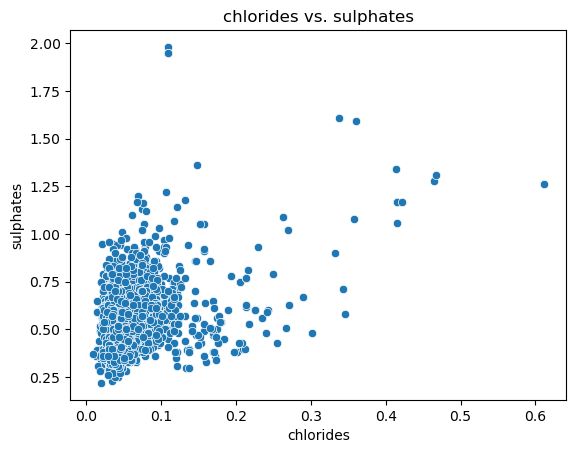

REJECT NULL HYPOTHESIS!
Feature: chlorides and sulphates
Correlation: 0.3721
P-Value: 0.0000


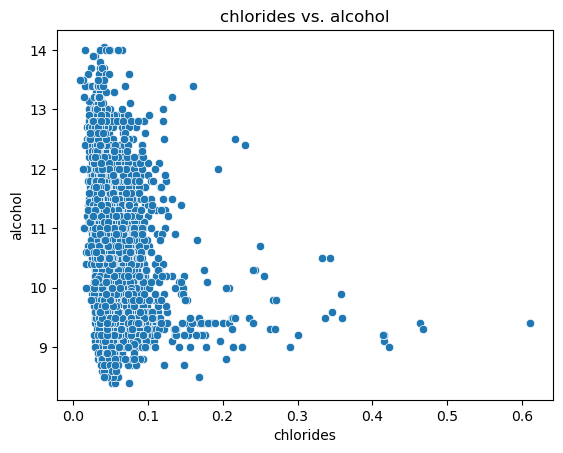

REJECT NULL HYPOTHESIS!
Feature: chlorides and alcohol
Correlation: -0.4022
P-Value: 0.0000


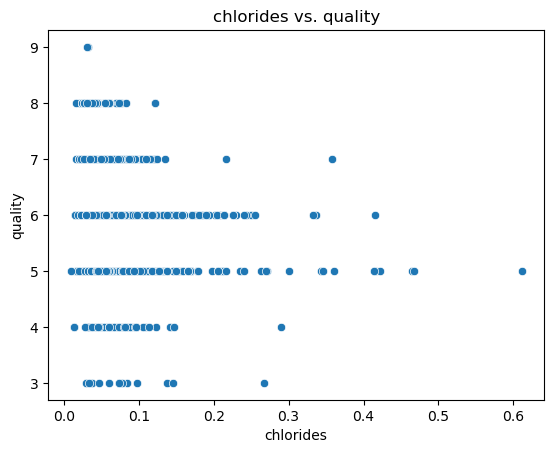

REJECT NULL HYPOTHESIS!
Feature: chlorides and quality
Correlation: -0.2799
P-Value: 0.0000


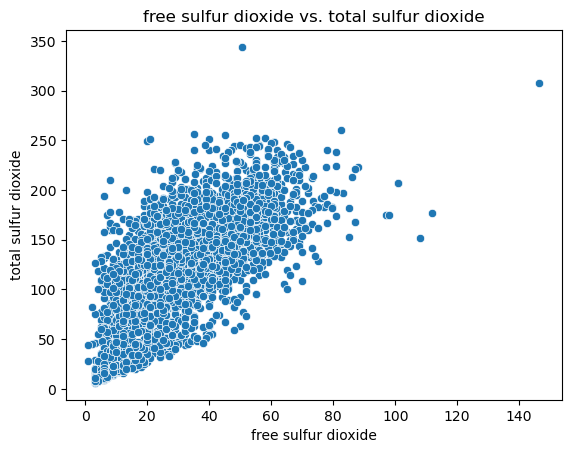

REJECT NULL HYPOTHESIS!
Feature: free sulfur dioxide and total sulfur dioxide
Correlation: 0.7422
P-Value: 0.0000


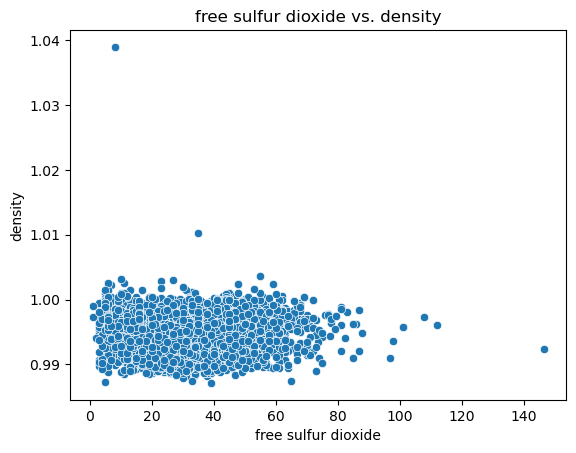

ACCEPT NULL HYPOTHESIS!
Feature: free sulfur dioxide and density
Correlation: 0.0062
P-Value: 0.7097


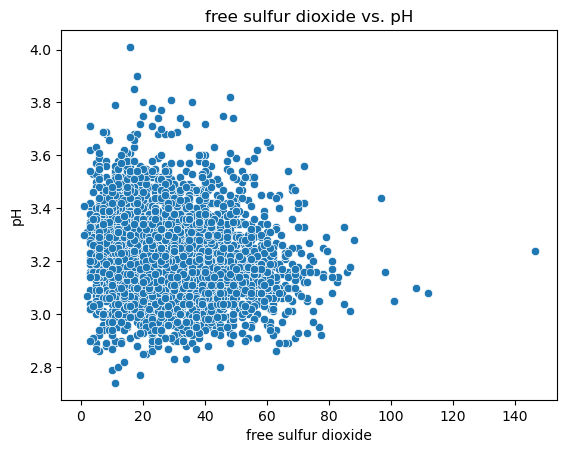

REJECT NULL HYPOTHESIS!
Feature: free sulfur dioxide and pH
Correlation: -0.1770
P-Value: 0.0000


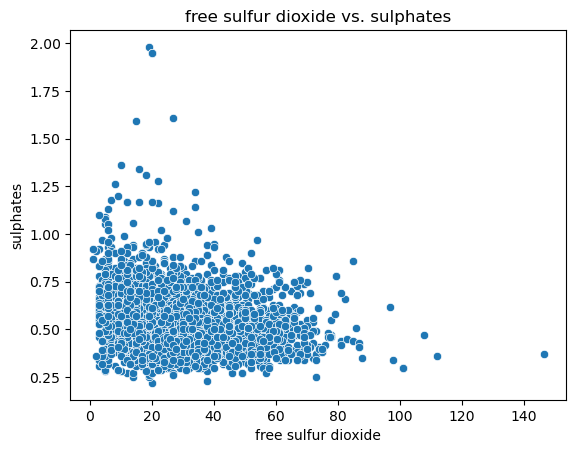

REJECT NULL HYPOTHESIS!
Feature: free sulfur dioxide and sulphates
Correlation: -0.2459
P-Value: 0.0000


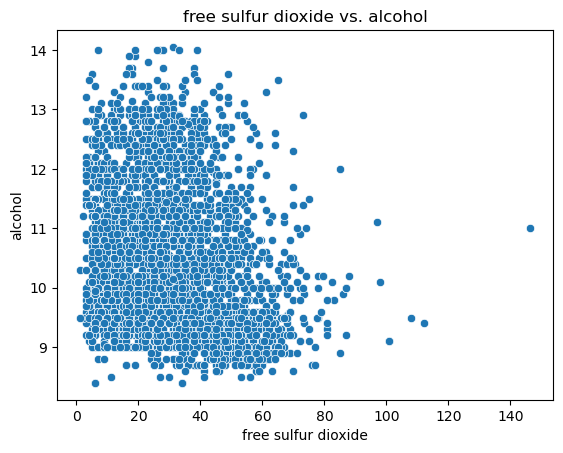

REJECT NULL HYPOTHESIS!
Feature: free sulfur dioxide and alcohol
Correlation: -0.1981
P-Value: 0.0000


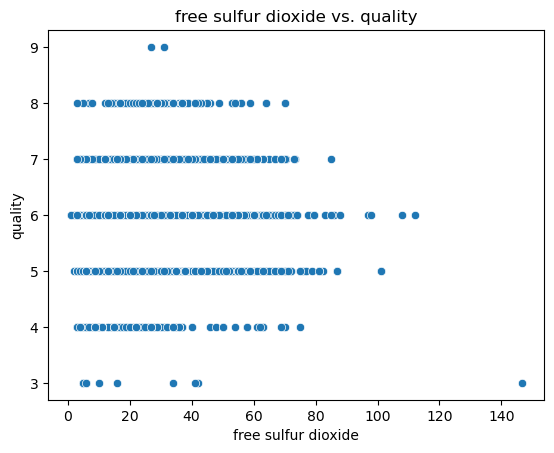

REJECT NULL HYPOTHESIS!
Feature: free sulfur dioxide and quality
Correlation: 0.0600
P-Value: 0.0003


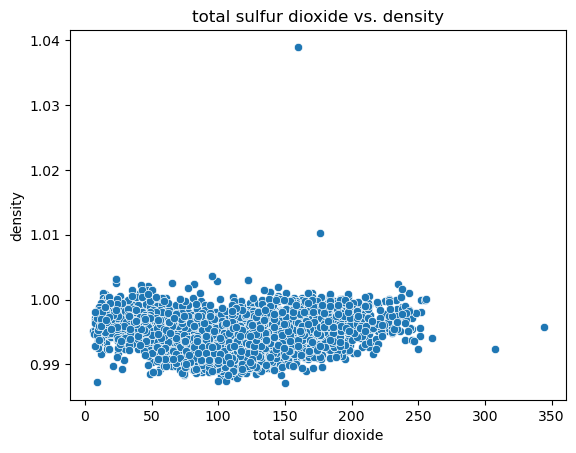

REJECT NULL HYPOTHESIS!
Feature: total sulfur dioxide and density
Correlation: 0.0491
P-Value: 0.0031


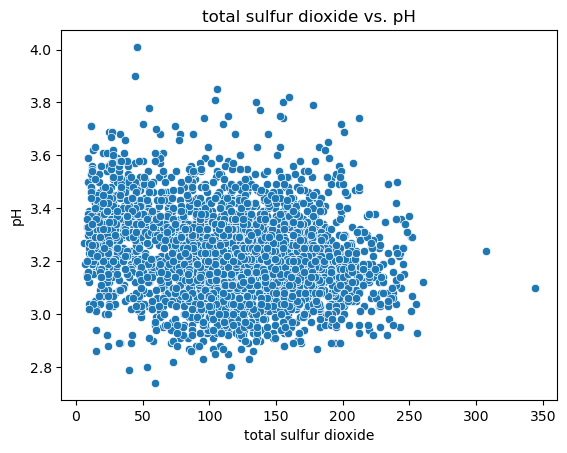

REJECT NULL HYPOTHESIS!
Feature: total sulfur dioxide and pH
Correlation: -0.2521
P-Value: 0.0000


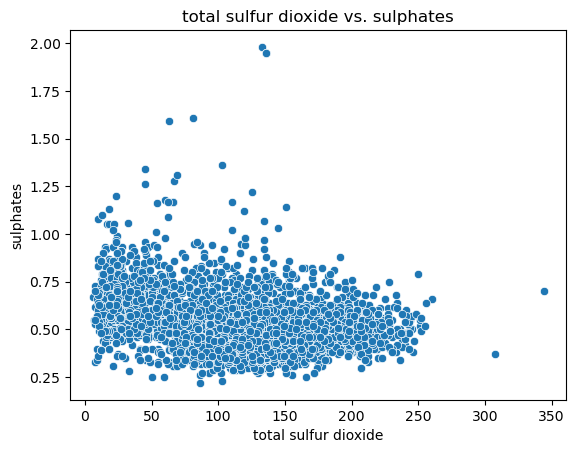

REJECT NULL HYPOTHESIS!
Feature: total sulfur dioxide and sulphates
Correlation: -0.2835
P-Value: 0.0000


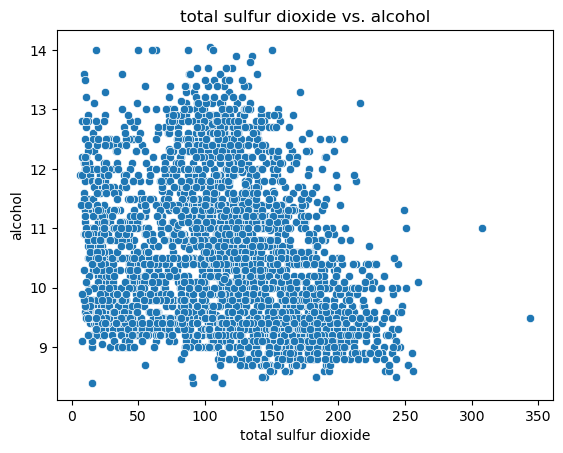

REJECT NULL HYPOTHESIS!
Feature: total sulfur dioxide and alcohol
Correlation: -0.3032
P-Value: 0.0000


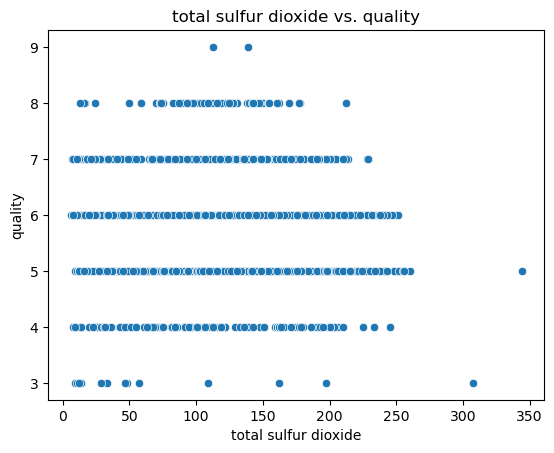

REJECT NULL HYPOTHESIS!
Feature: total sulfur dioxide and quality
Correlation: -0.0703
P-Value: 0.0000


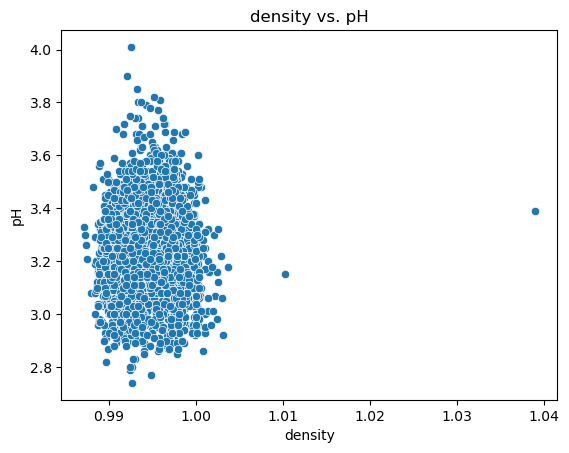

ACCEPT NULL HYPOTHESIS!
Feature: density and pH
Correlation: 0.0308
P-Value: 0.0636


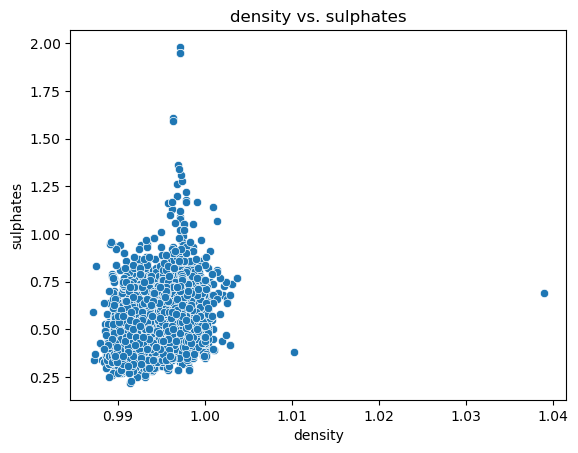

REJECT NULL HYPOTHESIS!
Feature: density and sulphates
Correlation: 0.2644
P-Value: 0.0000


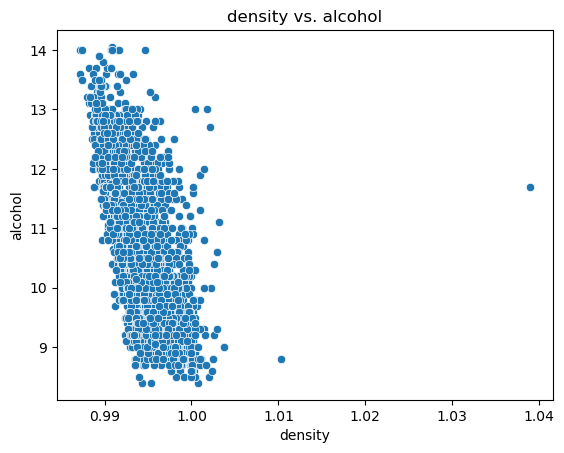

REJECT NULL HYPOTHESIS!
Feature: density and alcohol
Correlation: -0.6975
P-Value: 0.0000


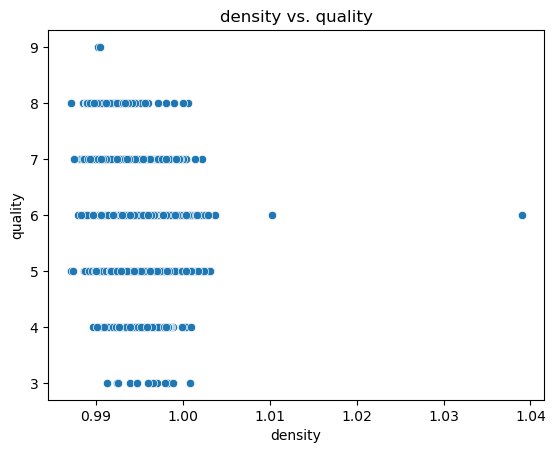

REJECT NULL HYPOTHESIS!
Feature: density and quality
Correlation: -0.3246
P-Value: 0.0000


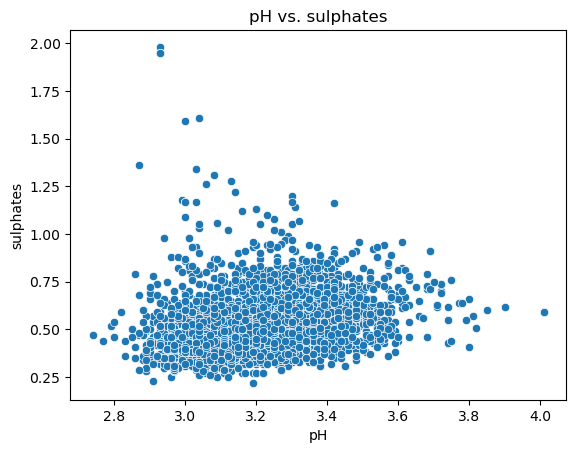

REJECT NULL HYPOTHESIS!
Feature: pH and sulphates
Correlation: 0.2693
P-Value: 0.0000


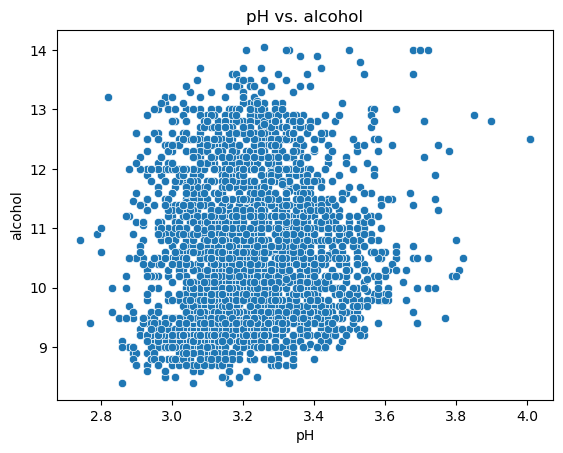

REJECT NULL HYPOTHESIS!
Feature: pH and alcohol
Correlation: 0.1399
P-Value: 0.0000


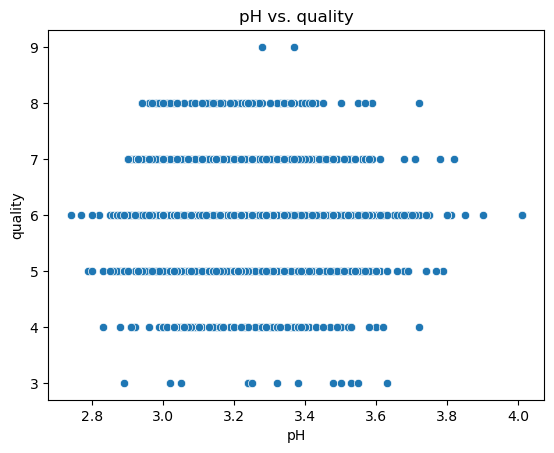

REJECT NULL HYPOTHESIS!
Feature: pH and quality
Correlation: 0.0414
P-Value: 0.0125


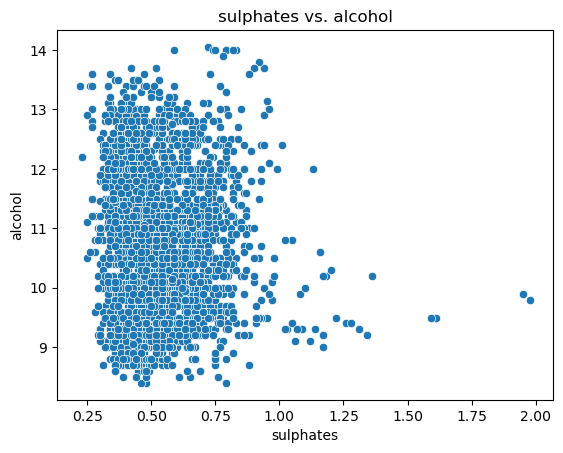

ACCEPT NULL HYPOTHESIS!
Feature: sulphates and alcohol
Correlation: 0.0177
P-Value: 0.2854


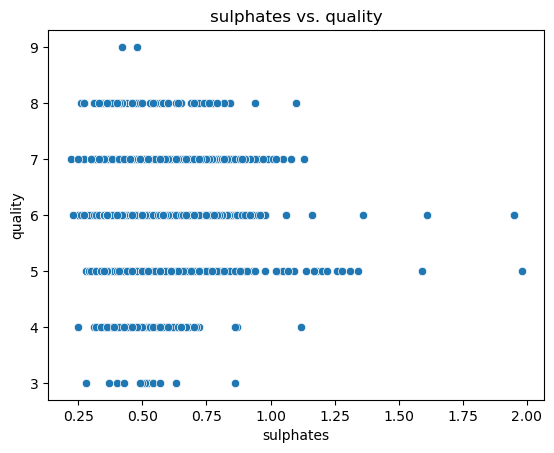

REJECT NULL HYPOTHESIS!
Feature: sulphates and quality
Correlation: 0.0391
P-Value: 0.0185


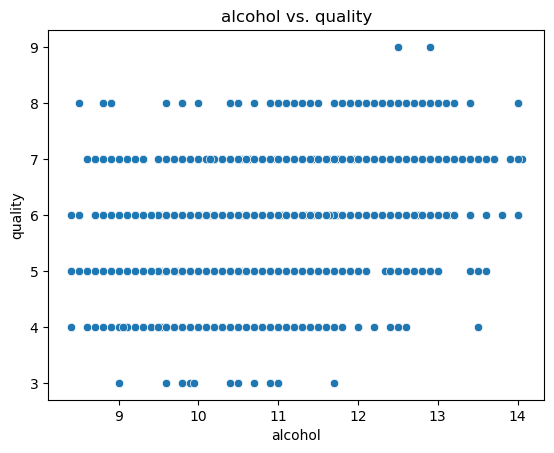

REJECT NULL HYPOTHESIS!
Feature: alcohol and quality
Correlation: 0.4466
P-Value: 0.0000


In [6]:
for combo in combos:
    sns.scatterplot(data=train, x=combo[0], y=combo[1])
    plt.title(f'{combo[0]} vs. {combo[1]}')
    plt.show()
    r, p = stats.spearmanr(train[combo[0]], train[combo[1]])
    alpha = 0.05
    if p < alpha:
        print(f'\033[32mREJECT NULL HYPOTHESIS!\033[0m')
        print(f'\033[35mFeature:\033[0m {combo[0]} and {combo[1]}')
        print(f'\033[35mCorrelation:\033[0m {r:.4f}')
        print(f'\033[35mP-Value:\033[0m {p:.4f}')
    else:
        print(f'\033[31mACCEPT NULL HYPOTHESIS!\033[0m')
        print(f'\033[35mFeature:\033[0m {combo[0]} and {combo[1]}')
        print(f'\033[35mCorrelation:\033[0m {r:.4f}')
        print(f'\033[35mP-Value:\033[0m {p:.4f}')

<div style='background-color: orange'>
<a id='clusters'></a>
    <b><u><i><h1 style='text-align: center'>
        Clustering
    </h1></i></u></b>
<li><a href='#TableOfContents'>Table of Contents</a></li>
<li><a href='#clusteringscale'>Scaling</a></li>
<li><a href='#clusteringcluster'>Clusters to Create</a></li>
<li><a href='#clusteringelbow'>Elbow of Clusters</a></li>
<li><a href='#clusteringcreate'>Create Cluster Predictions</a></li>

<a id='clusteringscale'></a>
### Scaling
<li><a href='#clusters'>Clustering Top</a></li>

In [7]:
# Scale columns with MinMaxScaler()
scale_cols = train.drop(columns=['quality', 'wine_color']).columns.to_list()
scale_train, scale_validate, scale_test = w.scale(train, validate, test, scale_cols, MinMaxScaler())
scale_train.sample()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_color
681,0.358974,0.246667,0.23,0.023041,0.141196,0.103093,0.068047,0.174928,0.370079,0.153409,0.318584,6,red


---

In [8]:
train.columns.to_list()

['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol',
 'quality',
 'wine_color']

<a id='clusteringcluster'></a>
### Clusters to Create
<li><a href='#clusters'>Clustering Top</a></li>

- Tartness
    - fixed acidity
    - volatile acidity
    - citric acid
    - pH
- Structure
    - total sulfur dioxide
    - pH
    - alcohol
- Aroma
    - volatile acidity
    - citric acid
    - sulphates
    - alcohol
- Taste
    - fixed acidity
    - volatile acidity
    - residual sugar
    - chlorides
    - pH
    - sulphates
    - alcohol
- Flavor
    - fixed acidity
    - volatile acidity
    - citric acid
    - residual sugar
    - chlorides
    - free sulfur dioxide
    - total sulfur dioxide
    - density
    - pH
    - sulphates
    - alcohol
- Mouthfeel
    - density
    - pH
    - alcohol
- Alcohol
    - residual sugar
    - alcohol
- Acidity
    - fixed acidity
    - volatile acidity
    - citric acid
    - pH

In [9]:
# List for Tartness
tartness_for_cluster_train = scale_train[['fixed acidity',
                                          'volatile acidity',
                                          'citric acid',
                                          'pH']]
tartness_for_cluster_validate = scale_validate[['fixed acidity',
                                                'volatile acidity',
                                                'citric acid',
                                                'pH']]
tartness_for_cluster_test = scale_test[['fixed acidity',
                                        'volatile acidity',
                                        'citric acid',
                                        'pH']]

# List for Structure
structure_for_cluster_train = scale_train[['total sulfur dioxide',
                                           'pH',
                                           'alcohol']]
structure_for_cluster_validate = scale_validate[['total sulfur dioxide',
                                                 'pH',
                                                 'alcohol']]
structure_for_cluster_test = scale_test[['total sulfur dioxide',
                                         'pH',
                                         'alcohol']]

# List for Aroma
aroma_for_cluster_train = scale_train[['volatile acidity',
                                       'citric acid',
                                       'sulphates',
                                       'alcohol']]
aroma_for_cluster_validate = scale_validate[['volatile acidity',
                                             'citric acid',
                                             'sulphates',
                                             'alcohol']]
aroma_for_cluster_test = scale_test[['volatile acidity',
                                     'citric acid',
                                     'sulphates',
                                     'alcohol']]

# List for Taste
taste_for_cluster_train = scale_train[['fixed acidity',
                                       'volatile acidity',
                                       'residual sugar',
                                       'chlorides',
                                       'pH',
                                       'sulphates',
                                       'alcohol']]
taste_for_cluster_validate = scale_validate[['fixed acidity',
                                             'volatile acidity',
                                             'residual sugar',
                                             'chlorides',
                                             'pH',
                                             'sulphates',
                                             'alcohol']]
taste_for_cluster_test = scale_test[['fixed acidity',
                                     'volatile acidity',
                                     'residual sugar',
                                     'chlorides',
                                     'pH',
                                     'sulphates',
                                     'alcohol']]

# List for Flavor
flavor_for_cluster_train = scale_train[['fixed acidity',
                                        'volatile acidity',
                                        'citric acid',
                                        'residual sugar',
                                        'chlorides',
                                        'free sulfur dioxide',
                                        'total sulfur dioxide',
                                        'density',
                                        'pH',
                                        'sulphates',
                                        'alcohol']]
flavor_for_cluster_validate = scale_validate[['fixed acidity',
                                              'volatile acidity',
                                              'citric acid',
                                              'residual sugar',
                                              'chlorides',
                                              'free sulfur dioxide',
                                              'total sulfur dioxide',
                                              'density',
                                              'pH',
                                              'sulphates',
                                              'alcohol']]
flavor_for_cluster_test = scale_test[['fixed acidity',
                                      'volatile acidity',
                                      'citric acid',
                                      'residual sugar',
                                      'chlorides',
                                      'free sulfur dioxide',
                                      'total sulfur dioxide',
                                      'density',
                                      'pH',
                                      'sulphates',
                                      'alcohol']]

# List for Mouthfeel
mouthfeel_for_cluster_train = scale_train[['density',
                                           'pH',
                                           'alcohol']]
mouthfeel_for_cluster_validate = scale_validate[['density',
                                                 'pH',
                                                 'alcohol']]
mouthfeel_for_cluster_test = scale_test[['density',
                                         'pH',
                                         'alcohol']]

# List for Alcohol
alcohol_for_cluster_train = scale_train[['residual sugar',
                                         'alcohol']]
alcohol_for_cluster_validate = scale_validate[['residual sugar',
                                               'alcohol']]
alcohol_for_cluster_test = scale_test[['residual sugar',
                                       'alcohol']]

# List for Acidity
acidity_for_cluster_train = scale_train[['fixed acidity',
                                         'volatile acidity',
                                         'citric acid',
                                         'pH']]
acidity_for_cluster_validate = scale_validate[['fixed acidity',
                                               'volatile acidity',
                                               'citric acid',
                                               'pH']]
acidity_for_cluster_test = scale_test[['fixed acidity',
                                       'volatile acidity',
                                       'citric acid',
                                       'pH']]

---

<a id='clusteringelbow'></a>
### Elbow of Clusters
<li><a href='#clusters'>Clustering Top</a></li>

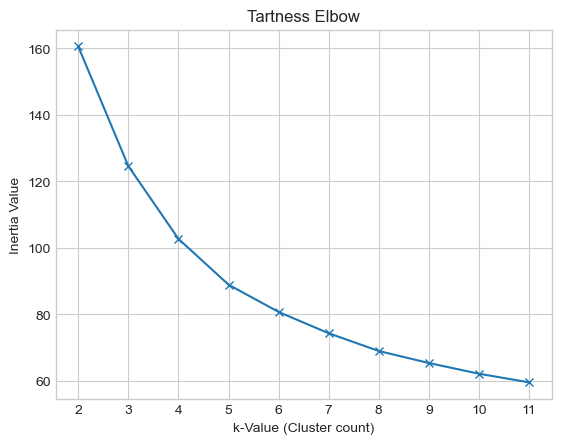

In [10]:
with plt.style.context('seaborn-whitegrid'):
    pd.Series({k: KMeans(k).fit(tartness_for_cluster_train).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.title('Tartness Elbow')
    plt.ylabel('Inertia Value')
    plt.xlabel('k-Value (Cluster count)')
    plt.xticks(range(2, 12))
    plt.show()

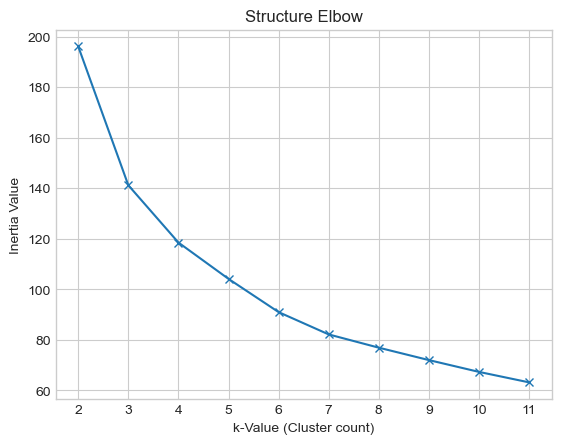

In [11]:
with plt.style.context('seaborn-whitegrid'):
    pd.Series({k: KMeans(k).fit(structure_for_cluster_train).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.title('Structure Elbow')
    plt.ylabel('Inertia Value')
    plt.xlabel('k-Value (Cluster count)')
    plt.xticks(range(2, 12))
    plt.show()

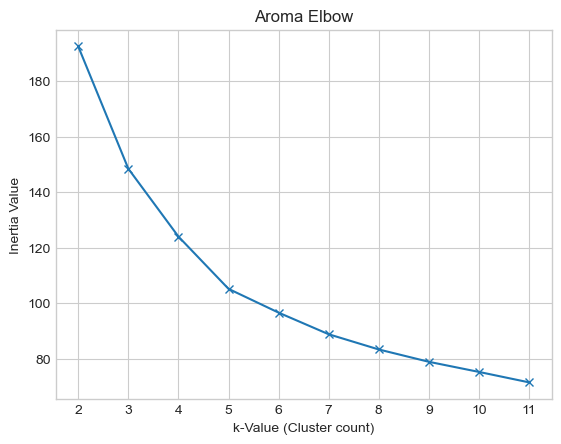

In [12]:
with plt.style.context('seaborn-whitegrid'):
    pd.Series({k: KMeans(k).fit(aroma_for_cluster_train).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.title('Aroma Elbow')
    plt.ylabel('Inertia Value')
    plt.xlabel('k-Value (Cluster count)')
    plt.xticks(range(2, 12))
    plt.show()

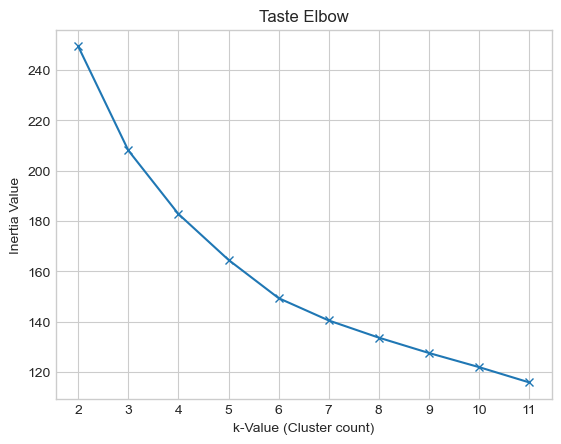

In [13]:
with plt.style.context('seaborn-whitegrid'):
    pd.Series({k: KMeans(k).fit(taste_for_cluster_train).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.title('Taste Elbow')
    plt.ylabel('Inertia Value')
    plt.xlabel('k-Value (Cluster count)')
    plt.xticks(range(2, 12))
    plt.show()

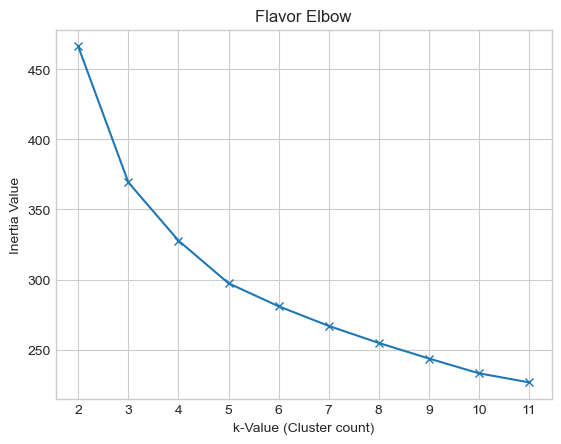

In [14]:
with plt.style.context('seaborn-whitegrid'):
    pd.Series({k: KMeans(k).fit(flavor_for_cluster_train).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.title('Flavor Elbow')
    plt.ylabel('Inertia Value')
    plt.xlabel('k-Value (Cluster count)')
    plt.xticks(range(2, 12))
    plt.show()

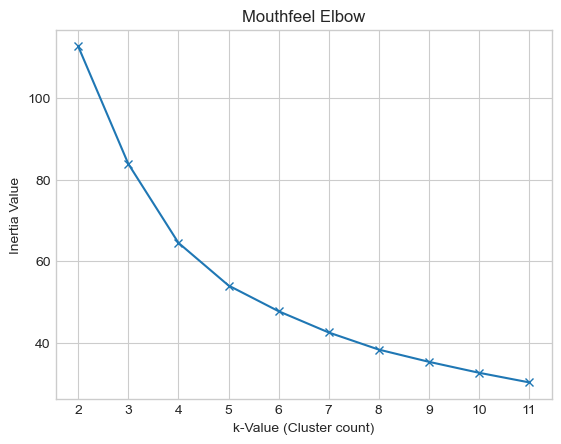

In [15]:
with plt.style.context('seaborn-whitegrid'):
    pd.Series({k: KMeans(k).fit(mouthfeel_for_cluster_train).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.title('Mouthfeel Elbow')
    plt.ylabel('Inertia Value')
    plt.xlabel('k-Value (Cluster count)')
    plt.xticks(range(2, 12))
    plt.show()

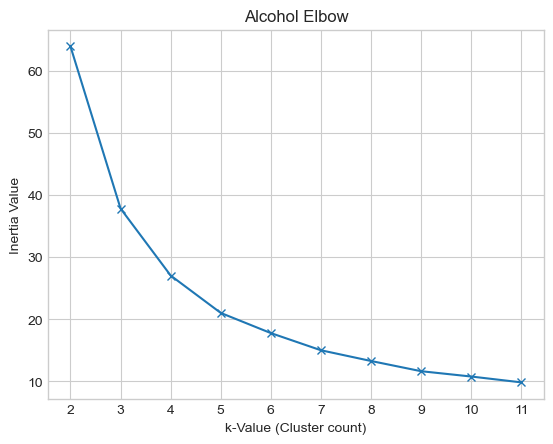

In [16]:
with plt.style.context('seaborn-whitegrid'):
    pd.Series({k: KMeans(k).fit(alcohol_for_cluster_train).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.title('Alcohol Elbow')
    plt.ylabel('Inertia Value')
    plt.xlabel('k-Value (Cluster count)')
    plt.xticks(range(2, 12))
    plt.show()

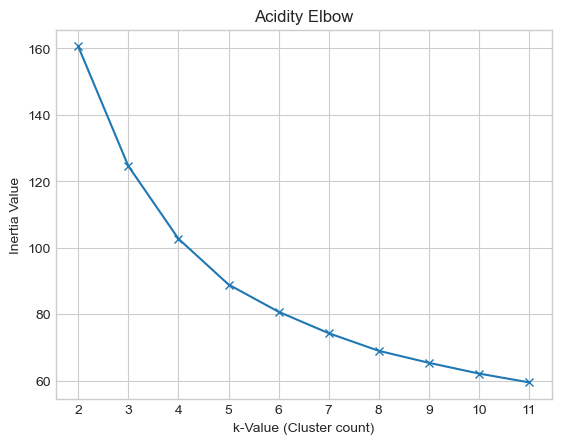

In [17]:
with plt.style.context('seaborn-whitegrid'):
    pd.Series({k: KMeans(k).fit(acidity_for_cluster_train).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.title('Acidity Elbow')
    plt.ylabel('Inertia Value')
    plt.xlabel('k-Value (Cluster count)')
    plt.xticks(range(2, 12))
    plt.show()

Takeaway:
- Cluster of 5 for each group

---

<a id='clusteringcreate'></a>
### Create Cluster Predictions
<li><a href='#clusters'>Clustering Top</a></li>

In [18]:
# Make the thing
kmeans = KMeans(n_clusters=5)

# Fit & Use on tartness
kmeans.fit(tartness_for_cluster_train)
train['tartness_cluster'] = kmeans.predict(tartness_for_cluster_train)
kmeans.fit(tartness_for_cluster_validate)
validate['tartness_cluster'] = kmeans.predict(tartness_for_cluster_validate)
kmeans.fit(tartness_for_cluster_test)
test['tartness_cluster'] = kmeans.predict(tartness_for_cluster_test)

# Fit & Use on structure
kmeans.fit(structure_for_cluster_train)
train['structure_cluster'] = kmeans.predict(structure_for_cluster_train)
kmeans.fit(structure_for_cluster_validate)
validate['structure_cluster'] = kmeans.predict(structure_for_cluster_validate)
kmeans.fit(structure_for_cluster_test)
test['structure_cluster'] = kmeans.predict(structure_for_cluster_test)

# Fit & Use on aroma
kmeans.fit(aroma_for_cluster_train)
train['aroma_cluster'] = kmeans.predict(aroma_for_cluster_train)
kmeans.fit(aroma_for_cluster_validate)
validate['aroma_cluster'] = kmeans.predict(aroma_for_cluster_validate)
kmeans.fit(aroma_for_cluster_test)
test['aroma_cluster'] = kmeans.predict(aroma_for_cluster_test)

# Fit & Use on taste
kmeans.fit(taste_for_cluster_train)
train['taste_cluster'] = kmeans.predict(taste_for_cluster_train)
kmeans.fit(taste_for_cluster_validate)
validate['taste_cluster'] = kmeans.predict(taste_for_cluster_validate)
kmeans.fit(taste_for_cluster_test)
test['taste_cluster'] = kmeans.predict(taste_for_cluster_test)

# Fit & Use on flavor
kmeans.fit(flavor_for_cluster_train)
train['flavor_cluster'] = kmeans.predict(flavor_for_cluster_train)
kmeans.fit(flavor_for_cluster_validate)
validate['flavor_cluster'] = kmeans.predict(flavor_for_cluster_validate)
kmeans.fit(flavor_for_cluster_test)
test['flavor_cluster'] = kmeans.predict(flavor_for_cluster_test)

# Fit & Use on mouthfeel
kmeans.fit(mouthfeel_for_cluster_train)
train['mouthfeel_cluster'] = kmeans.predict(mouthfeel_for_cluster_train)
kmeans.fit(mouthfeel_for_cluster_validate)
validate['mouthfeel_cluster'] = kmeans.predict(mouthfeel_for_cluster_validate)
kmeans.fit(mouthfeel_for_cluster_test)
test['mouthfeel_cluster'] = kmeans.predict(mouthfeel_for_cluster_test)

# Fit & Use on alcohol
kmeans.fit(alcohol_for_cluster_train)
train['alcohol_cluster'] = kmeans.predict(alcohol_for_cluster_train)
kmeans.fit(alcohol_for_cluster_validate)
validate['alcohol_cluster'] = kmeans.predict(alcohol_for_cluster_validate)
kmeans.fit(alcohol_for_cluster_test)
test['alcohol_cluster'] = kmeans.predict(alcohol_for_cluster_test)

# Fit & Use on acidity **** 
kmeans.fit(acidity_for_cluster_train)
train['acidity_cluster'] = kmeans.predict(acidity_for_cluster_train)
kmeans.fit(acidity_for_cluster_validate)
validate['acidity_cluster'] = kmeans.predict(acidity_for_cluster_validate)
kmeans.fit(acidity_for_cluster_test)
test['acidity_cluster'] = kmeans.predict(acidity_for_cluster_test)

# BEHOLD YOUR NEW DF
train.sample()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,...,quality,wine_color,tartness_cluster,structure_cluster,aroma_cluster,taste_cluster,flavor_cluster,mouthfeel_cluster,alcohol_cluster,acidity_cluster
457,7.1,0.21,0.27,8.6,0.056,26.0,111.0,0.9956,2.95,0.52,...,5,white,1,0,0,1,0,2,3,1


In [19]:
train['agg_score'] = (train.tartness_cluster +
                      train.structure_cluster +
                      train.aroma_cluster +
                      train.taste_cluster +
                      train.flavor_cluster +
                      train.mouthfeel_cluster +
                      train.alcohol_cluster +
                      train.acidity_cluster) / 8
validate['agg_score'] = (validate.tartness_cluster +
                         validate.structure_cluster +
                         validate.aroma_cluster +
                         validate.taste_cluster +
                         validate.flavor_cluster +
                         validate.mouthfeel_cluster +
                         validate.alcohol_cluster +
                         validate.acidity_cluster) / 8
test['agg_score'] = (test.tartness_cluster +
                     test.structure_cluster +
                     test.aroma_cluster +
                     test.taste_cluster +
                     test.flavor_cluster +
                     test.mouthfeel_cluster +
                     test.alcohol_cluster +
                     test.acidity_cluster) / 8

<div style='background-color: orange'>
<a id='model'></a>
    <b><u><i><h1 style='text-align: center'>
        Modeling
    </h1></i></u></b>
<li><a href='#TableOfContents'>Table of Contents</a></li>
<li><a href='#feature'>Feature Selection</a></li>
<li><a href='#clusterselection'>Cluster Selection</a></li>
<li><a href='#Baseline'>Baseline</a></li>
<li><a href='#withoutcluster'>Without Clusters</a></li>
<li><a href='#withcluster'>With Clusters</a></li>
<li><a href='#both'>With Both</a></li>
<li><a href='#top5'>Top 5</a></li>

<a id='feature'></a>
### Feature Selection
<li><a href='#model'>Modeling Top</a></li>

In [20]:
train[train.columns[:12]].corr()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,0.228925,0.311737,-0.112373,0.290413,-0.289156,-0.341345,0.454039,-0.231590,0.284099,-0.100408,-0.083775
volatile acidity,0.228925,1.000000,-0.402200,-0.191566,0.366278,-0.365034,-0.425773,0.276796,0.268288,0.240525,-0.038308,-0.258349
citric acid,0.311737,-0.402200,1.000000,0.143183,0.042612,0.144969,0.200596,0.091715,-0.334474,0.030728,-0.023938,0.073216
residual sugar,-0.112373,-0.191566,0.143183,1.000000,-0.132398,0.413821,0.491449,0.562227,-0.259578,-0.190847,-0.351983,-0.046174
chlorides,0.290413,0.366278,0.042612,-0.132398,1.000000,-0.198682,-0.288223,0.349038,0.058338,0.396080,-0.253420,-0.186309
free sulfur dioxide,-0.289156,-0.365034,0.144969,0.413821,-0.198682,1.000000,0.728155,0.027571,-0.164760,-0.225418,-0.197666,0.038973
total sulfur dioxide,-0.341345,-0.425773,0.200596,0.491449,-0.288223,0.728155,1.000000,0.020132,-0.247309,-0.293453,-0.264721,-0.051332
density,0.454039,0.276796,0.091715,0.562227,0.349038,0.027571,0.020132,1.000000,0.030701,0.243881,-0.674054,-0.305874
pH,-0.231590,0.268288,-0.334474,-0.259578,0.058338,-0.164760,-0.247309,0.030701,1.000000,0.206548,0.120922,0.027144
sulphates,0.284099,0.240525,0.030728,-0.190847,0.396080,-0.225418,-0.293453,0.243881,0.206548,1.000000,0.007962,0.038475


Top 3 Features:
- alcohol .449
- density -.306
- volatile acidity -.258

In [21]:
# Define x/y train, val, test
x_feature_train = train[['alcohol',
                         'density',
                         'volatile acidity']]
y_feature_train = train['quality']
x_feature_validate = validate[['alcohol',
                         'density',
                         'volatile acidity']]
y_feature_validate = validate['quality']
x_feature_test = test[['alcohol',
                         'density',
                         'volatile acidity']]
y_feature_test = test['quality']

---

<a id='clusterselection'></a>
### Cluster Selection
<li><a href='#model'>Modeling Top</a></li>

In [22]:
train[train.columns[11:]].corr()

,quality,tartness_cluster,structure_cluster,aroma_cluster,taste_cluster,flavor_cluster,mouthfeel_cluster,alcohol_cluster,acidity_cluster,agg_score
quality,1.000000,0.001333,0.112634,0.230086,-0.060555,0.179511,0.241015,-0.101943,0.022705,0.187281
tartness_cluster,0.001333,1.000000,0.009453,0.146739,-0.258233,-0.061961,-0.225124,-0.033716,0.511916,0.271766
structure_cluster,0.112634,0.009453,1.000000,0.016616,-0.131004,0.676086,0.029739,0.354791,-0.086168,0.605078
aroma_cluster,0.230086,0.146739,0.016616,1.000000,0.390398,-0.035871,0.423962,-0.015149,0.216700,0.590030
taste_cluster,-0.060555,-0.258233,-0.131004,0.390398,1.000000,-0.252148,-0.039550,0.111269,-0.119114,0.175599
flavor_cluster,0.179511,-0.061961,0.676086,-0.035871,-0.252148,1.000000,0.081909,0.288679,0.072235,0.575115
mouthfeel_cluster,0.241015,-0.225124,0.029739,0.423962,-0.039550,0.081909,1.000000,-0.110283,0.095506,0.350080
alcohol_cluster,-0.101943,-0.033716,0.354791,-0.015149,0.111269,0.288679,-0.110283,1.000000,-0.089697,0.462806
acidity_cluster,0.022705,0.511916,-0.086168,0.216700,-0.119114,0.072235,0.095506,-0.089697,1.000000,0.408601
agg_score,0.187281,0.271766,0.605078,0.590030,0.175599,0.575115,0.350080,0.462806,0.408601,1.000000


Top 3 Features:
- structure_cluster -.326
- agg_score -.300
- alcohol_cluster -.298

In [23]:
# Define x/y train, val, test
x_cluster_train = train[['alcohol_cluster',
                         'agg_score',
                         'structure_cluster']]
y_cluster_train = train['quality']
x_cluster_validate = validate[['alcohol_cluster',
                               'agg_score',
                               'structure_cluster']]
y_cluster_validate = validate['quality']
x_cluster_test = test[['alcohol_cluster',
                       'agg_score',
                       'structure_cluster']]
y_cluster_test = test['quality']

---

<a id='Baseline'></a>
### Baseline
<li><a href='#model'>Modeling Top</a></li>

In [24]:
# Baseline predictions is 6
base_train = round(1572/train.shape[0], 3)
base_validate = round(680/validate.shape[0], 3)
models_dict = {
    'Type': ['baseline'],
    'Clusters': ['No'],
    'Train Accuracy': [base_train],
    'Validate Accuracy': [base_validate],
    'Diff Accuracy': [base_validate - base_train]
}
pd.DataFrame(models_dict)

,Type,Clusters,Train Accuracy,Validate Accuracy,Diff Accuracy
0,baseline,No,0.432,0.436,0.004


---

<a id='withoutcluster'></a>
### Without Clusters
<li><a href='#model'>Modeling Top</a></li>

In [25]:
# Make the thing
rfc1 = RFC(max_depth=3, ccp_alpha=0.0015, random_state=100)

# Fit the thing
rfc1.fit(x_feature_train, y_feature_train)

# Use the thing
trainscore = round(rfc1.score(x_feature_train, y_feature_train), 3)
validatescore = round(rfc1.score(x_feature_validate, y_feature_validate), 3)
diffscore = validatescore - trainscore

# Append to models_dict
models_dict['Type'].append('rfc_top3features_depth3_ccpalpha0.0015')
models_dict['Clusters'].append('No')
models_dict['Train Accuracy'].append(trainscore)
models_dict['Validate Accuracy'].append(validatescore)
models_dict['Diff Accuracy'].append(diffscore)
pd.DataFrame(models_dict)

,Type,Clusters,Train Accuracy,Validate Accuracy,Diff Accuracy
0,baseline,No,0.432,0.436,0.004
1,rfc_top3features_depth3_ccpalpha0.0015,No,0.550,0.542,-0.008


---

<a id='withcluster'></a>
### With Clusters
<li><a href='#model'>Modeling Top</a></li>

In [26]:
# Make the thing
rfc2 = RFC(max_depth=5, random_state=100)

# Fit the thing
rfc2.fit(x_cluster_train, y_cluster_train)

# Use the thing
trainscore = round(rfc2.score(x_cluster_train, y_cluster_train), 3)
validatescore = round(rfc2.score(x_cluster_validate, y_cluster_validate), 3)
diffscore = validatescore - trainscore

# Append to models_dict
models_dict['Type'].append('rfc_top3clusters_depth5')
models_dict['Clusters'].append('Yes')
models_dict['Train Accuracy'].append(trainscore)
models_dict['Validate Accuracy'].append(validatescore)
models_dict['Diff Accuracy'].append(diffscore)
pd.DataFrame(models_dict)

,Type,Clusters,Train Accuracy,Validate Accuracy,Diff Accuracy
0,baseline,No,0.432,0.436,0.004
1,rfc_top3features_depth3_ccpalpha0.0015,No,0.550,0.542,-0.008
2,rfc_top3clusters_depth5,Yes,0.527,0.397,-0.130


---

<a id='both'></a>
### With Both
<li><a href='#model'>Modeling Top</a></li>

In [27]:
# Define x/y train, val, test
x_both_train = train[['alcohol',
                     'density',
                     'volatile acidity',
                     'alcohol_cluster',
                     'agg_score',
                     'structure_cluster']]
y_both_train = train['quality']
x_both_validate = validate[['alcohol',
                           'density',
                           'volatile acidity',
                           'alcohol_cluster',
                           'agg_score',
                           'structure_cluster']]
y_both_validate = validate['quality']
x_both_test = test[['alcohol',
                    'density',
                    'volatile acidity',
                    'alcohol_cluster',
                    'agg_score',
                    'structure_cluster']]
y_both_test = test['quality']

# Make the thing
rfc3 = RFC(max_depth=5, ccp_alpha=0.0015, random_state=100)

# Fit the thing
rfc3.fit(x_both_train, y_both_train)

# Use the thing
trainscore = round(rfc3.score(x_both_train, y_both_train), 3)
validatescore = round(rfc3.score(x_both_validate, y_both_validate), 3)
diffscore = validatescore - trainscore

# Append to models_dict
models_dict['Type'].append('rfc_both_depth5_ccpalpha0.0015')
models_dict['Clusters'].append('Yes')
models_dict['Train Accuracy'].append(trainscore)
models_dict['Validate Accuracy'].append(validatescore)
models_dict['Diff Accuracy'].append(diffscore)
pd.DataFrame(models_dict)

,Type,Clusters,Train Accuracy,Validate Accuracy,Diff Accuracy
0,baseline,No,0.432,0.436,0.004
1,rfc_top3features_depth3_ccpalpha0.0015,No,0.550,0.542,-0.008
2,rfc_top3clusters_depth5,Yes,0.527,0.397,-0.130
3,rfc_both_depth5_ccpalpha0.0015,Yes,0.566,0.533,-0.033


---

<a id='top5'></a>
### Top 5
<li><a href='#model'>Modeling Top</a></li>

In [28]:
# Identify top 5 corr
train.corr()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,...,quality,tartness_cluster,structure_cluster,aroma_cluster,taste_cluster,flavor_cluster,mouthfeel_cluster,alcohol_cluster,acidity_cluster,agg_score
fixed acidity,1.000000,0.228925,0.311737,-0.112373,0.290413,-0.289156,-0.341345,0.454039,-0.231590,0.284099,...,-0.083775,-0.382535,0.017910,0.095547,0.467294,0.044481,0.068284,0.084553,0.192541,0.163039
volatile acidity,0.228925,1.000000,-0.402200,-0.191566,0.366278,-0.365034,-0.425773,0.276796,0.268288,0.240525,...,-0.258349,-0.153059,-0.003253,0.209801,0.607901,-0.224671,-0.210841,0.130973,-0.349744,0.000789
citric acid,0.311737,-0.402200,1.000000,0.143183,0.042612,0.144969,0.200596,0.091715,-0.334474,0.030728,...,0.073216,0.233634,-0.099188,0.214463,-0.123092,0.062046,0.214404,-0.138900,0.789917,0.293553
residual sugar,-0.112373,-0.191566,0.143183,1.000000,-0.132398,0.413821,0.491449,0.562227,-0.259578,-0.190847,...,-0.046174,0.029188,-0.347454,-0.209236,-0.211559,-0.393910,0.000895,-0.439926,0.100298,-0.451528
chlorides,0.290413,0.366278,0.042612,-0.132398,1.000000,-0.198682,-0.288223,0.349038,0.058338,0.396080,...,-0.186309,-0.084939,-0.062289,0.014990,0.417467,-0.118119,-0.205470,0.146659,0.021673,0.025804
free sulfur dioxide,-0.289156,-0.365034,0.144969,0.413821,-0.198682,1.000000,0.728155,0.027571,-0.164760,-0.225418,...,0.038973,0.161182,-0.246152,-0.169755,-0.363246,-0.291812,0.022876,-0.209532,0.141436,-0.296553
total sulfur dioxide,-0.341345,-0.425773,0.200596,0.491449,-0.288223,0.728155,1.000000,0.020132,-0.247309,-0.293453,...,-0.051332,0.191808,-0.277546,-0.248057,-0.495420,-0.242110,0.058920,-0.205189,0.188052,-0.317651
density,0.454039,0.276796,0.091715,0.562227,0.349038,0.027571,0.020132,1.000000,0.030701,0.243881,...,-0.305874,-0.106747,-0.293076,-0.281465,0.303118,-0.396938,-0.406351,-0.107977,0.076210,-0.375252
pH,-0.231590,0.268288,-0.334474,-0.259578,0.058338,-0.164760,-0.247309,0.030701,1.000000,0.206548,...,0.027144,0.304475,0.150420,0.028833,0.201616,0.081918,-0.523726,0.191875,-0.152550,0.091976
sulphates,0.284099,0.240525,0.030728,-0.190847,0.396080,-0.225418,-0.293453,0.243881,0.206548,1.000000,...,0.038475,-0.055987,0.008265,0.104929,0.367159,0.026902,-0.160667,0.101441,0.030160,0.117546


- alcohol .449
- structure_cluster -.326
- density -.306
- agg_score -.300
- alcohol_cluster -.298

In [29]:
# Define x/y train, val, test
x_top5_train = train[['alcohol',
                     'structure_cluster',
                     'density',
                     'agg_score',
                     'alcohol_cluster']]
y_top5_train = train['quality']
x_top5_validate = validate[['alcohol',
                           'structure_cluster',
                           'density',
                           'agg_score',
                           'alcohol_cluster']]
y_top5_validate = validate['quality']
x_top5_test = test[['alcohol',
                   'structure_cluster',
                   'density',
                   'agg_score',
                   'alcohol_cluster']]
y_top5_test = test['quality']

# Make the thing
rfc4 = RFC(max_depth=4, ccp_alpha=0.0007, random_state=100)

# Fit the thing
rfc4.fit(x_top5_train, y_top5_train)

# Use the thing
trainscore = round(rfc4.score(x_top5_train, y_top5_train), 3)
validatescore = round(rfc4.score(x_top5_validate, y_top5_validate), 3)
diffscore = validatescore - trainscore

# Append to models_dict
models_dict['Type'].append('rfc_top5_depth4_ccpalpha0.0007')
models_dict['Clusters'].append('Yes')
models_dict['Train Accuracy'].append(trainscore)
models_dict['Validate Accuracy'].append(validatescore)
models_dict['Diff Accuracy'].append(diffscore)
pd.DataFrame(models_dict)

,Type,Clusters,Train Accuracy,Validate Accuracy,Diff Accuracy
0,baseline,No,0.432,0.436,0.004
1,rfc_top3features_depth3_ccpalpha0.0015,No,0.550,0.542,-0.008
2,rfc_top3clusters_depth5,Yes,0.527,0.397,-0.130
3,rfc_both_depth5_ccpalpha0.0015,Yes,0.566,0.533,-0.033
4,rfc_top5_depth4_ccpalpha0.0007,Yes,0.527,0.514,-0.013


In [30]:
feature_testscore = round(rfc1.score(x_feature_test, y_feature_test), 3)
both_testscore = round(rfc3.score(x_both_test, y_both_test), 3)
test_dict = {
    'Type' : ['baseline', 'rfc_top3features_depth3_ccpalpha0.0015', 'rfc_both_depth5_ccpalpha0.0015'],
    'Clusters' : ['No', 'No', 'Yes'],
    'Test Accuracy' : [round(584/test.shape[0], 3), feature_testscore, both_testscore]
}
pd.DataFrame(test_dict)

,Type,Clusters,Test Accuracy
0,baseline,No,0.449
1,rfc_top3features_depth3_ccpalpha0.0015,No,0.520
2,rfc_both_depth5_ccpalpha0.0015,Yes,0.531


<div style='background-color: orange'>
<a id='misc'></a>
    <b><u><i><h1 style='text-align: center'>
        Miscellaneous
    </h1></i></u></b>
    <li><a href='#TableOfContents'>Table of Contents</a></li>